In [35]:
import pandas as pd
import matplotlib.pyplot as plt
import pickle

# data

In [2]:
concern_cols = [
    'Economy_concern-3.1', 
    'Terrorism and Counterterrorism_concern-3.2',
    'Religion_concern-3.3',
    'International Alliance Organizations_concern-3.5',
    'Immigration and Refugees_concern-3.4',
    'Relationship with Russia_concern-3.6',
    'National Identity and National Pride_concern-3.7',
    'Environment and Climate Change_concern-3.8',
    'Fake News/Misinformation_concern-3.9', 
    'Democracy_concern-3.11']
agenda_cols = ['vote for_agenda-2.2.1', 'vote against_agenda-2.2.2',
       'Believe that ENTITY or GROUP is moral/ethical/honest/beneficial_agenda-1.4',
       'Believe that ENTITY or GROUP is immoral/unethical/dishonest/harmful_agenda-1.3']
emotion_cols = ['Anger, Hate, Contempt, Disgust_emotion-4.1',
       'Embarrassment, Guilt, Shame, Sadness_emotion-4.2',
       'Admiration, Love_emotion-4.3', 'Optimism, Hope_emotion-4.4',
       'Joy, Happiness_emotion-4.5',
       'Pride, including National Pride_emotion-4.6',
       'Fear, Pessimism_emotion-4.7', 'Amusement_emotion-4.8',
       'Positive-other_emotion-4.9', 'Negative-other_emotion-4.10']
all_cols = concern_cols + agenda_cols + emotion_cols

In [3]:
df = pd.read_csv('~/Desktop/INCAS/data/DARPA_Phase1A_CIA_Tweets/CIA_Tweets.csv',lineterminator='\n')
df['timePublished'] = pd.to_datetime(pd.to_datetime(df['timePublished']).astype(int),unit='ms')

/var/folders/c4/xg4_cw2510q9mzqkdznf_16r0000gq/T/ipykernel_82408/2610577687.py:2: FutureWarning: casting datetime64[ns] values to int64 with .astype(...) is deprecated and will raise in a future version. Use .view(...) instead.
  df['timePublished'] = pd.to_datetime(pd.to_datetime(df['timePublished']).astype(int),unit='ms')


In [37]:
df.columns

Index(['id', 'name', 'contentText', 'mediaType', 'language', 'imageUrls',
       'timePublished', 'retweetCount', 'twitterAuthorScreenname', 'tweetId',
       'twitterUserId', 'followingCount', 'followerCount', 'engagementType',
       'engagementParentId', 'mentionedUsers', 'providerName', 'tweetId.1',
       'tweetName', 'Terrorism and Counterterrorism_concern-3.2',
       'Economy_concern-3.1', 'Religion_concern-3.3',
       'Immigration and Refugees_concern-3.4',
       'Relationship with Russia_concern-3.6',
       'Environment and Climate Change_concern-3.8',
       'National Identity and National Pride_concern-3.7',
       'International Alliance Organizations_concern-3.5',
       'Fake News/Misinformation_concern-3.9', 'Democracy_concern-3.11',
       'vote for_agenda-2.2.1', 'vote against_agenda-2.2.2',
       'Believe that ENTITY or GROUP is moral/ethical/honest/beneficial_agenda-1.4',
       'Believe that ENTITY or GROUP is immoral/unethical/dishonest/harmful_agenda-1.3',
  

In [4]:
def aggregate_df(df):
    df['timePublished'] = pd.to_datetime(df['timePublished'])
    df['timePublished'] = df['timePublished'].dt.round('H')
    df_hourly = df.groupby('timePublished')[all_cols].sum()
    df_hourly['count'] = df.groupby('timePublished')['id'].count()
    df_hourly.reset_index(inplace=True)

    df_hourly['timePublished'] = pd.to_datetime(df_hourly['timePublished'])
    df_hourly['date'] = df_hourly['timePublished'].dt.round('D')
    df_daily = df_hourly.groupby('date')[all_cols+['count']].sum()
    df_daily[all_cols] = df_daily[all_cols].div(df_daily['count'],axis=0)
    
    df_hourly = df_hourly.groupby(pd.Grouper(freq='12H', key='timePublished'))[all_cols+['count']].sum()
    df_hourly[all_cols] = df_hourly[all_cols].div(df_hourly['count'],axis=0)
    # df_daily.loc[df_daily['count']<50,all_cols] = 0
    return df_hourly, df_daily

In [5]:
df_hourly,df_daily = aggregate_df(df)

In [6]:
df_hourly

,Economy_concern-3.1,Terrorism and Counterterrorism_concern-3.2,Religion_concern-3.3,International Alliance Organizations_concern-3.5,Immigration and Refugees_concern-3.4,Relationship with Russia_concern-3.6,National Identity and National Pride_concern-3.7,Environment and Climate Change_concern-3.8,Fake News/Misinformation_concern-3.9,Democracy_concern-3.11,...,"Embarrassment, Guilt, Shame, Sadness_emotion-4.2","Admiration, Love_emotion-4.3","Optimism, Hope_emotion-4.4","Joy, Happiness_emotion-4.5","Pride, including National Pride_emotion-4.6","Fear, Pessimism_emotion-4.7",Amusement_emotion-4.8,Positive-other_emotion-4.9,Negative-other_emotion-4.10,count
timePublished,,,,,,,,,,,,,,,,,,,,,
2017-02-18 00:00:00,0.115584,0.030578,0.010959,0.248928,0.086303,0.010219,0.128255,0.023396,0.036080,0.044818,...,0.045283,0.143463,0.100365,0.036069,0.071113,0.049850,0.109786,0.211979,0.121606,3405
2017-02-18 12:00:00,0.141978,0.046276,0.008787,0.259225,0.093516,0.008008,0.105878,0.022201,0.032599,0.046413,...,0.039604,0.128740,0.093652,0.030286,0.056130,0.053155,0.111612,0.214216,0.124270,1663
2017-02-19 00:00:00,0.117905,0.038273,0.012006,0.236653,0.091420,0.008918,0.160101,0.034057,0.069927,0.061519,...,0.045260,0.162155,0.088476,0.036855,0.067577,0.054877,0.105570,0.213866,0.126740,4425
2017-02-19 12:00:00,0.249806,0.017657,0.011246,0.293508,0.082415,0.009003,0.120489,0.048070,0.054607,0.034375,...,0.033041,0.141608,0.118868,0.042804,0.055917,0.041837,0.078614,0.261405,0.101536,14500
2017-02-20 00:00:00,0.151296,0.016655,0.009394,0.230997,0.074381,0.011199,0.115683,0.033258,0.069323,0.034559,...,0.031457,0.157404,0.085420,0.039663,0.044288,0.040291,0.107877,0.221330,0.114838,4102
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-05-30 00:00:00,0.089708,0.049868,0.008012,0.184101,0.068955,0.134492,0.144943,0.027317,0.064194,0.021666,...,0.050695,0.138736,0.051804,0.032964,0.038672,0.058557,0.143614,0.170054,0.144507,13476
2017-05-30 12:00:00,0.101646,0.054429,0.007110,0.181954,0.050143,0.078650,0.124348,0.025683,0.077192,0.029241,...,0.044962,0.153540,0.065252,0.036300,0.048919,0.054830,0.137437,0.198848,0.128127,19772
2017-05-31 00:00:00,0.098441,0.054507,0.006960,0.205426,0.041896,0.041976,0.149688,0.040680,0.075535,0.049672,...,0.054872,0.121649,0.068829,0.028654,0.040708,0.057610,0.138517,0.191753,0.146442,10938


# Plot time series

In [7]:
def plot_ts(df,columns,events=[],title=''):
    plt.figure()
    colors = ['coral','navy','turquoise','forestgreen','gold','darkviolet','sienna','grey']
    # colors = plt.cm.Set2.colors[3:6]+ ('crimson','dodgerblue','green','darksalmon','grey','mediumblue','darkviolet')
    for c,color in zip(columns,colors): 
        df[c].plot(figsize=[8,3],kind='line',color=color) # label=c,
    for e in events:
        plt.axvline(pd.Timestamp(e[0]),color='black',linestyle=e[2])#,label=e[1]
    plt.title(title,fontsize=15)
    plt.ylabel('Fraction of tweets',fontsize=13)
    plt.xticks(fontsize=11)
    plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15),
      fancybox=True, shadow=True, ncol=1)

In [8]:
def plot_separate_ts(df,columns,events=[]):
    for c in columns:
        plt.figure()
        df[c].plot(figsize=[12,3],kind='line',color='black')
        for e in events:
            plt.axvline(pd.Timestamp(e[0]),label=e[1],color='red',linestyle=e[2])
        plt.title(c)
        plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15),
          fancybox=True, shadow=True, ncol=3)
        plt.show()

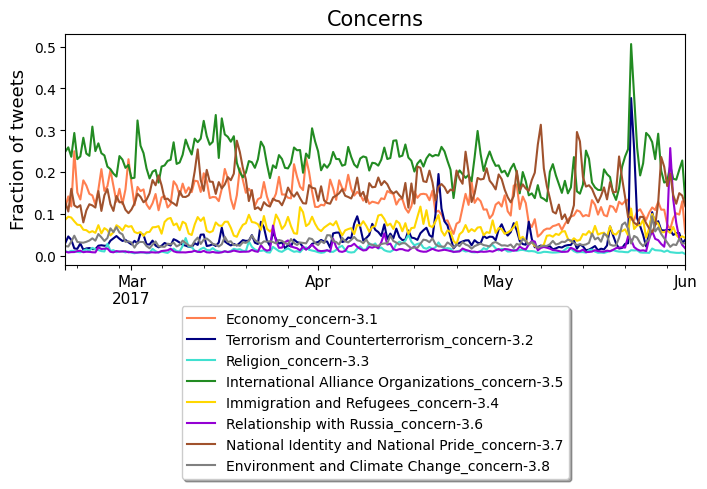

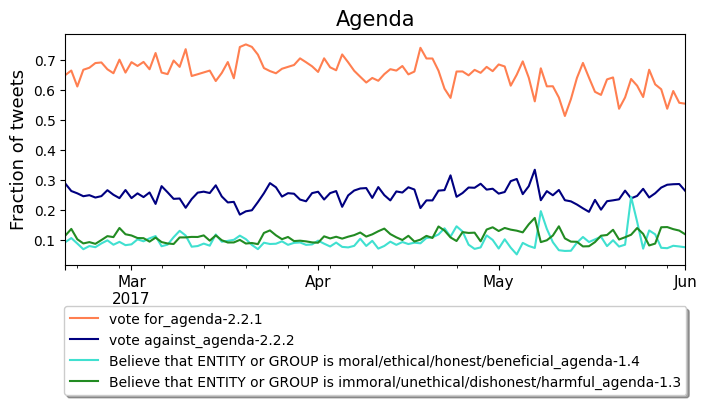

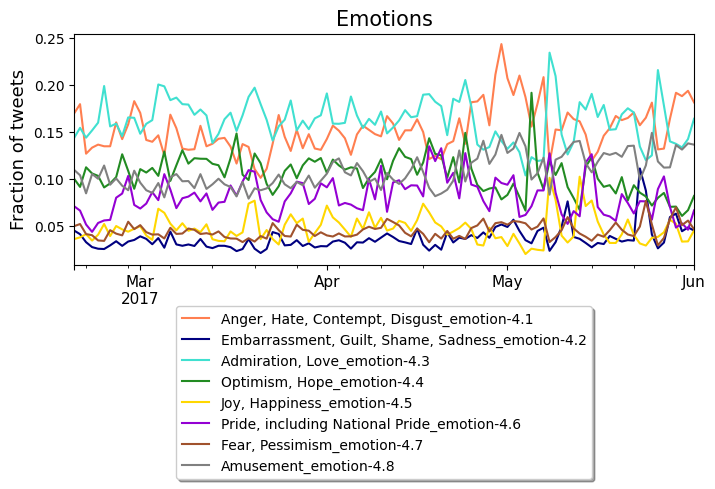

In [9]:
# plot time series in the same figure
plot_ts(df_hourly,
        concern_cols,
        events = [],#events,
        title='Concerns')

plot_ts(df_daily,
        agenda_cols,
        events = [],# events,
        title='Agenda')

plot_ts(df_daily,
        emotion_cols,
        events = [],# events,
        title='Emotions')

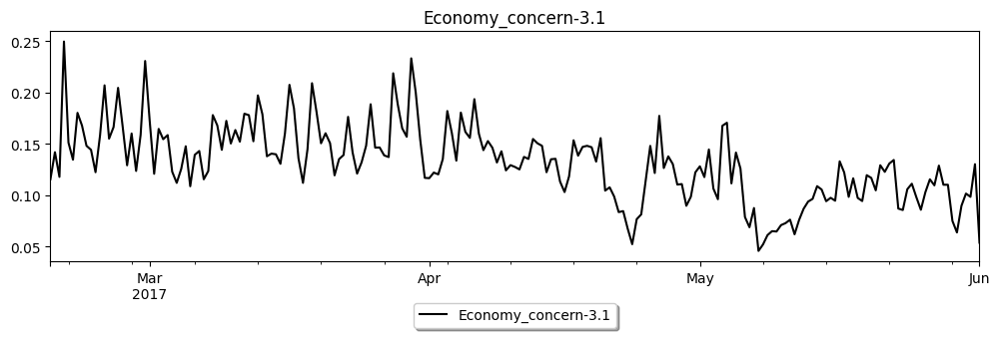

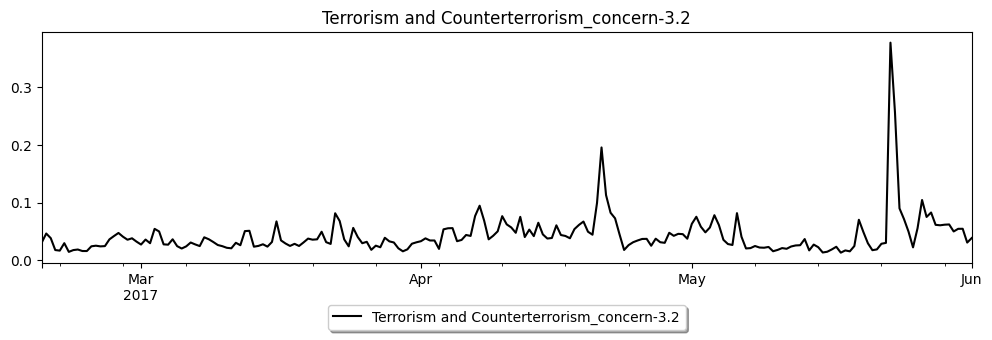

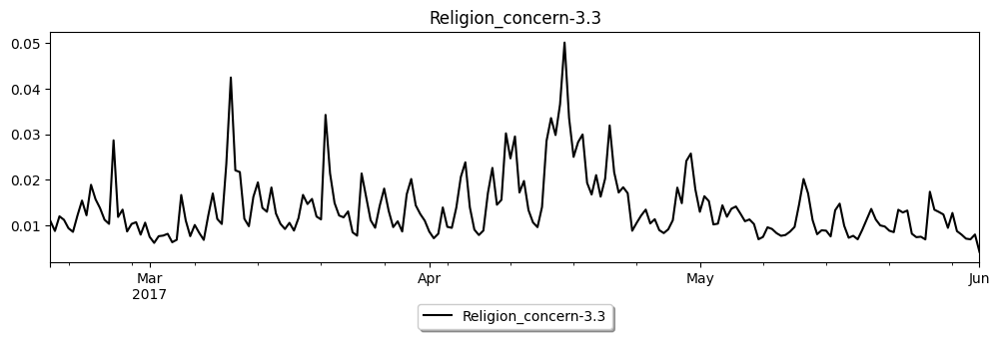

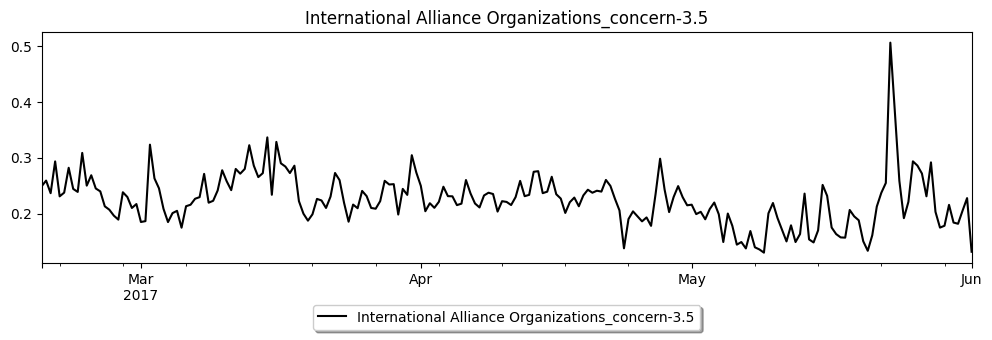

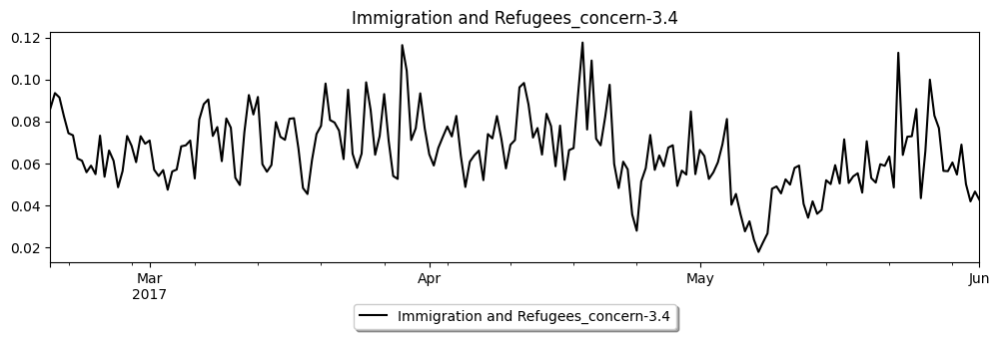

...

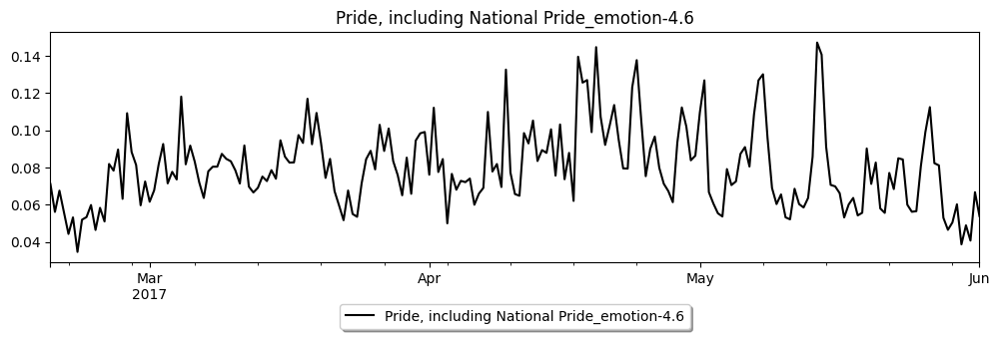

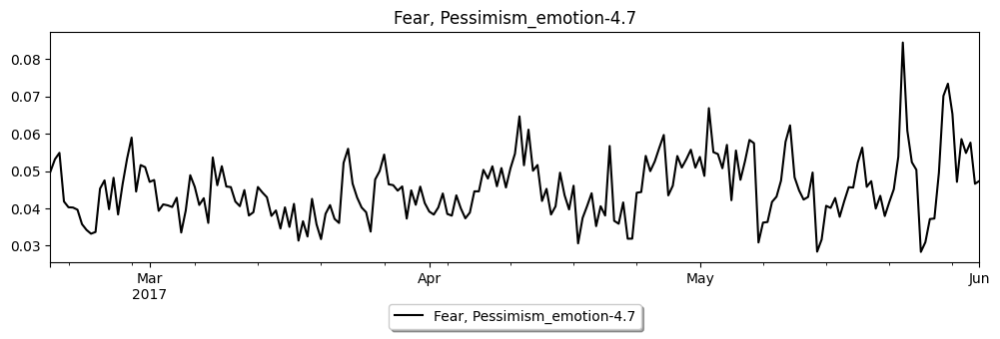

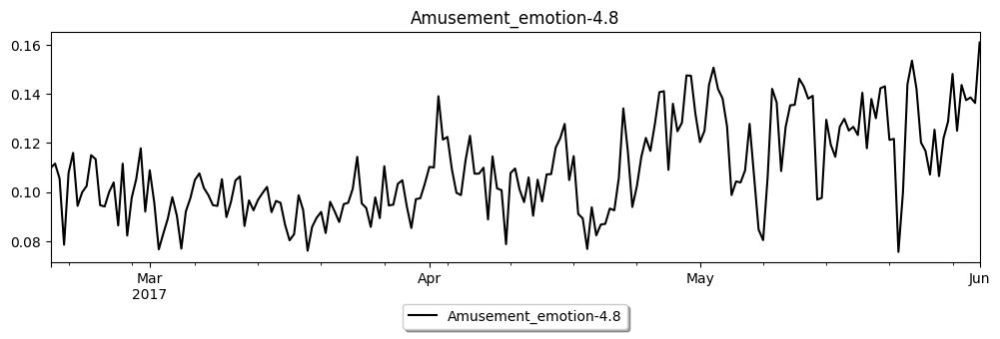

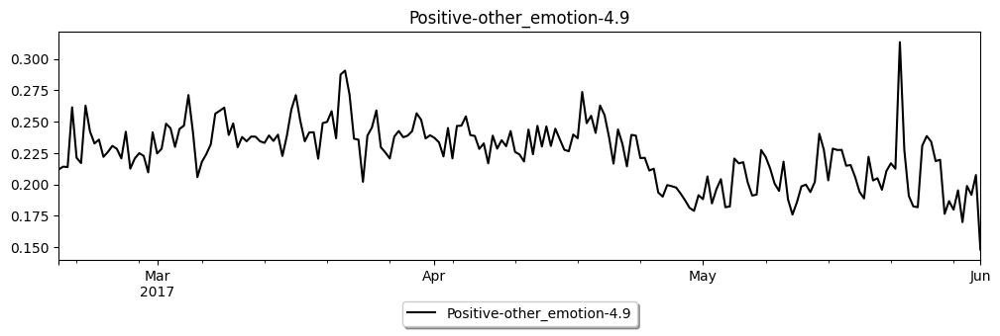

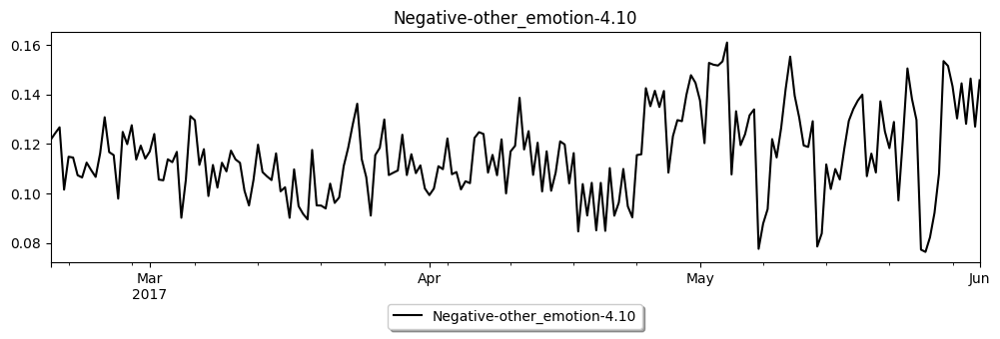

In [10]:
plot_separate_ts(
    df_hourly,
    all_cols,
    events = [],#events
)

# change point detection

In [32]:
import kats
from kats.utils.decomposition import TimeSeriesDecomposition
from kats.consts import TimeSeriesData
from kats.detectors.cusum_detection import CUSUMDetector
from kats.detectors.bocpd import BOCPDetector, BOCPDModelType, TrendChangeParameters

# use pyenv environment cpd_env, python version 3.9.17
# cpd_env_requirements_python_3_9_17.txt
# scipy version = 1.7.3
# pandas version = 1.3.5

def changepoint_detection(df,time_colname,var_colnames,title=''):
    changepoints = {}
    for c in var_colnames:
        # construct ts
        tmp_ts = df.reset_index()
        tmp_ts = tmp_ts[[time_colname,c]]
        tmp_ts[time_colname] = tmp_ts[time_colname].astype(str)
        tmp_ts.columns = ['time','value']
        ts = TimeSeriesData(tmp_ts)
        
        cp_list = []

        detector = BOCPDetector(ts)
        # BOCPD - assume normal distri
        cp_list.extend(detector.detector(
            model=BOCPDModelType.NORMAL_KNOWN_MODEL,
            changepoint_prior=0.05,
            threshold=0.5,
            agg_cp=True
        ))
#         # BOCPD - poisson
#         cp_list.extend(detector.detector(
#             model=BOCPDModelType.POISSON_PROCESS_MODEL
#         ))
#         # BOCPD - assume ordinary linear reg. 
#         cp_list.extend(detector.detector(
#             model=BOCPDModelType.TREND_CHANGE_MODEL,
#             model_parameters=TrendChangeParameters(
#                 readjust_sigma_prior=True, num_points_prior=14
#                 ),
#                 debug=True,
#                 threshold=0.6,
#                 choose_priors=False,
#                 agg_cp=True
#         ))
    
        # CUSUM - multiple change points
        historical_window = 7
        scan_window = 14
        step =4
        cpts = []
        n = len(ts)
        for end_idx in range(historical_window + scan_window, n, step):
            tsd = ts[end_idx - (historical_window + scan_window) : end_idx]
            cpts += CUSUMDetector(tsd).detector(interest_window=[historical_window, historical_window + scan_window])
        
        # Plot the data, add results
        plt.figure(figsize=[20,3])
        plt.title(title+" - "+c)
        detector.plot(cp_list)
        plt.figure(figsize=[20,3])
        detector1 = CUSUMDetector(ts) # we are not really using this detector
        detector1.detector()
        detector1.plot(cpts)
        cp_list.extend(cpts)

        cleaned_list = []
        for j in cp_list:
            try:
                time = pd.Timestamp(j[0].start_time,tz='utc')
            except:
                time = pd.Timestamp(j[0].start_time)
            cleaned_list.append((time,j[0].confidence))
            # print(time, j[0].confidence)
        
        cleaned_list.sort(key=lambda x: x[0])
        idx_to_remove = []
        for j in range(1,len(cleaned_list)):
            if abs((cleaned_list[j][0] - cleaned_list[j-1][0]).days) <= 7:
                idx_to_remove.append(j)
        # print(idx_to_remove)
        cleaned_list = [item for idx,item in enumerate(cleaned_list) if idx not in idx_to_remove]
        print('finalized change points:')
        for tmp in cleaned_list:
            print(tmp[0].date(), round(tmp[1],4))
            
        changepoints[c] = cleaned_list
    return changepoints


def detect_event(time,events):
    for e in events:
        if time >= pd.Timestamp(e[0])-pd.Timedelta(1,unit='D') and time <= pd.Timestamp(e[0])+pd.Timedelta(1,unit='D'):
            event_date = e[0]
            return True,e
    return False,None


def measure_mean_change(df_ts,time_colname,var_colname,event_time,before_window=7,after_window=7):
    try:
        event_time = pd.Timestamp(event_time, tz='utc')
    except:
        event_time = pd.Timestamp(event_time)
    start_time = event_time - pd.Timedelta(before_window,unit='D')
    end_time = event_time + pd.Timedelta(after_window,unit='D')

    before_mean = df_ts.loc[(df_ts[time_colname]>=start_time) & (df_ts[time_colname]<event_time),var_colname].mean()
    after_mean = df_ts.loc[(df_ts[time_colname]>=event_time) & (df_ts[time_colname]<end_time),var_colname].mean()
    
    return (after_mean-before_mean)/before_mean*100


import statsmodels.formula.api as smf

def measure_rdd_change(df_ts,time_colname,var_colname,event_time,before_window=7,after_window=7,mode='kink',plot=True):
    if mode == 'jump':
        effect_coef = 'threshold'
    elif mode == 'kink':
        effect_coef = 'date_to_int:threshold'
    
    try:
        event_time = pd.Timestamp(event_time, tz='UTC')
    except:
        event_time = pd.Timestamp(event_time)
    start_time = event_time - pd.Timedelta(before_window,unit='D')
    end_time = event_time + pd.Timedelta(after_window,unit='D')
    
    df = df_ts[(df_ts[time_colname]>=start_time) & (df_ts[time_colname]<=end_time)]
    df = df.sort_index()
    df['date_to_int'] = list(range(len(df)))
    event_idx = df.loc[df[time_colname]==event_time,'date_to_int'].item()
    df['date_to_int'] = df['date_to_int'] - event_idx # make date_to_int of the event zero
    df = df.assign(threshold=(df['date_to_int'] > 0).astype(int))
    
    model = smf.wls("Q('"+var_colname+"')~date_to_int*threshold", df).fit()
    ate_pct = round(100*((model.params[effect_coef] + model.params["Intercept"])/model.params["Intercept"] - 1),2)

In [ ]:
events = [
    ('2017-04-23','First round','-'),
    # ('2017-05-03','First leak on 4chan','--'),
    ('2017-05-07','Second round','-.'),
    ('2017-05-14','Macron took office',(0, (3, 5, 1, 5, 1, 5)))
]

/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "known_prec_multiplier". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.

/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "cp_prior". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.



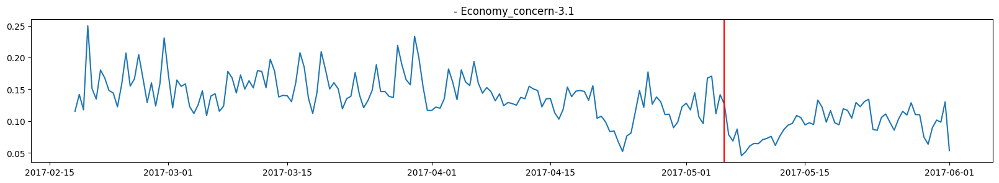

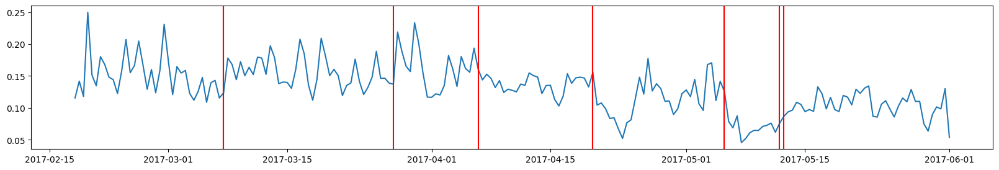

finalized change points:
2017-03-07 0.9986
2017-03-27 0.9988
2017-04-06 0.9963
2017-04-20 1.0
2017-05-05 0.6534


/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "known_prec_multiplier". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.

/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "cp_prior". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.



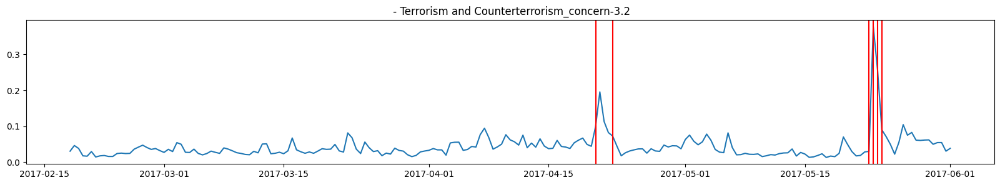

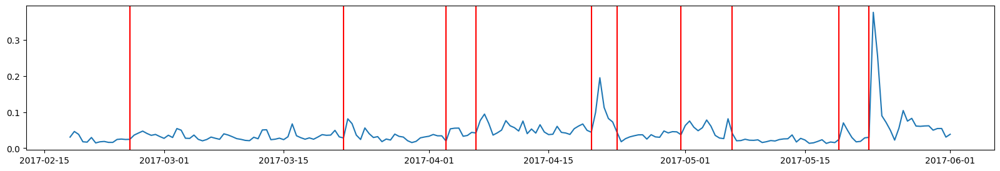

finalized change points:
2017-02-25 0.9985
2017-03-22 0.9981
2017-04-03 0.9997
2017-04-20 1.0
2017-05-19 1.0


/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "known_prec_multiplier". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.

/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "cp_prior". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.



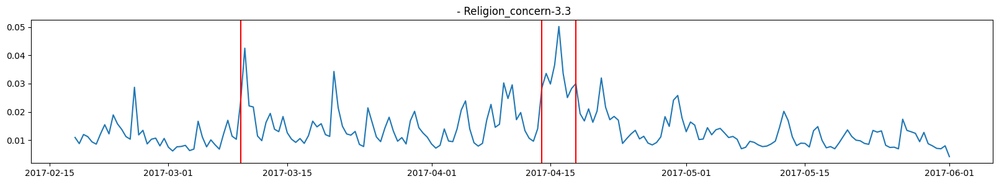

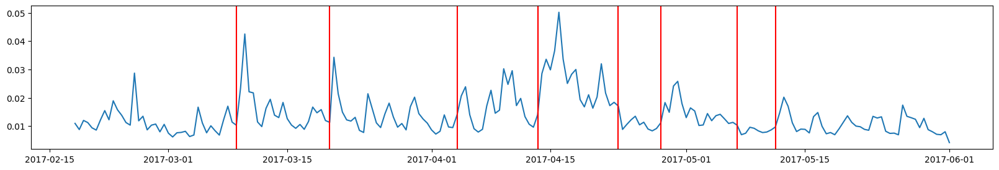

finalized change points:
2017-03-09 1.0
2017-03-20 0.9997
2017-04-04 0.9975
2017-04-13 0.9992
2017-05-07 1.0


/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "known_prec_multiplier". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.

/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "cp_prior". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.



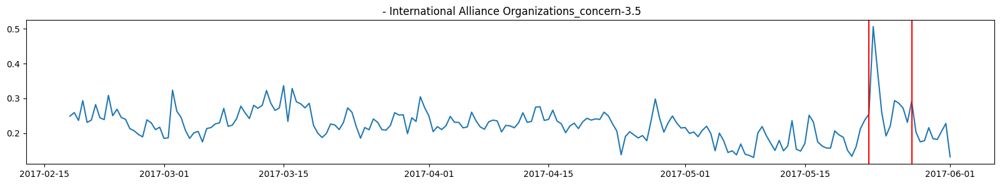

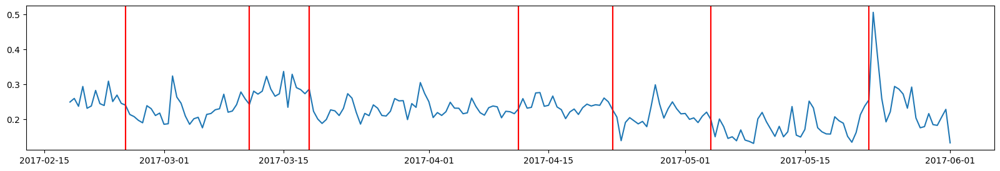

finalized change points:
2017-02-24 0.9993
2017-03-11 0.9996
2017-04-11 0.9956
2017-04-22 0.9997
2017-05-04 0.9979
2017-05-22 0.6062


/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "known_prec_multiplier". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.

/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "cp_prior". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.



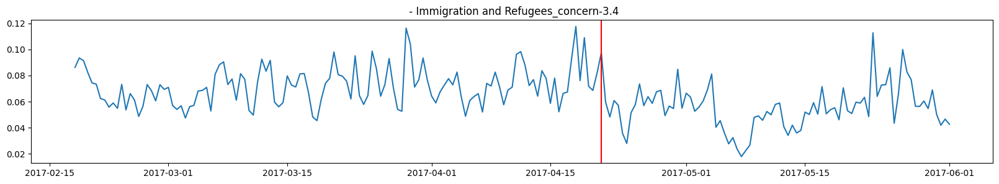

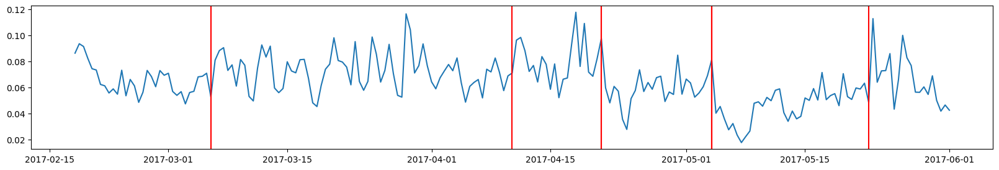

finalized change points:
2017-03-06 0.9998
2017-04-10 0.9967
2017-04-21 0.7231
2017-05-04 1.0
2017-05-22 1.0


/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "known_prec_multiplier". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.

/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "cp_prior". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.



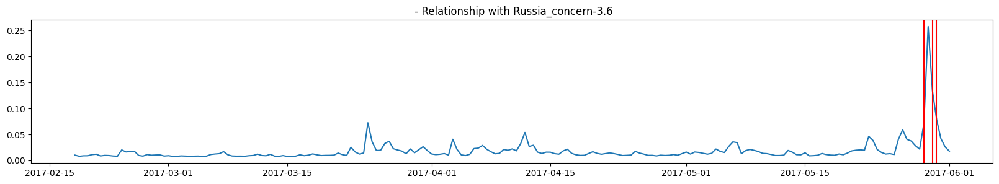

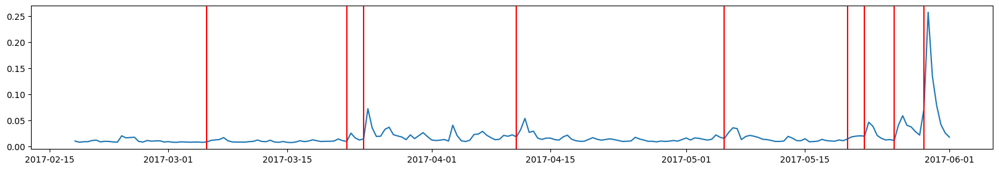

finalized change points:
2017-03-05 1.0
2017-03-22 1.0
2017-04-11 0.9943
2017-05-05 1.0
2017-05-20 0.9997


/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "known_prec_multiplier". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.

/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "cp_prior". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.



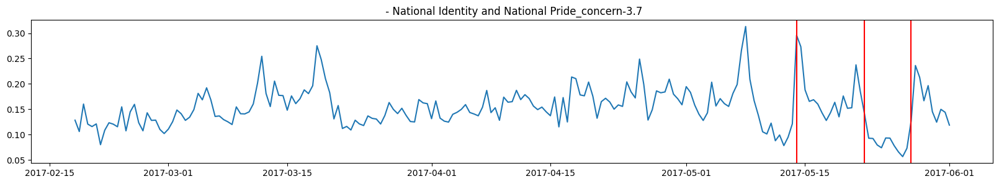

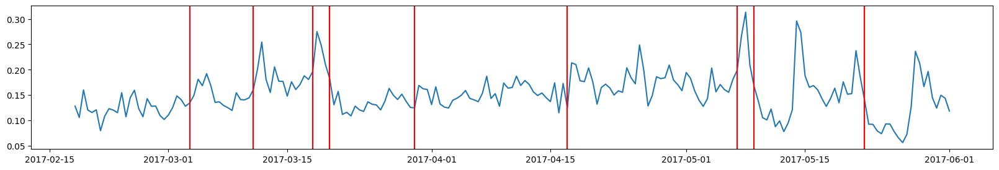

finalized change points:
2017-03-03 0.9999
2017-03-30 0.9976
2017-04-17 0.9946
2017-05-07 1.0
2017-05-22 0.6355


/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "known_prec_multiplier". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.

/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "cp_prior". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.



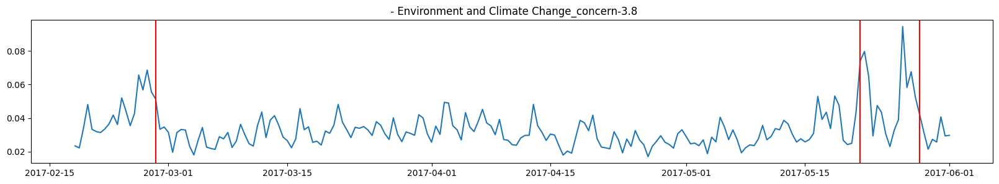

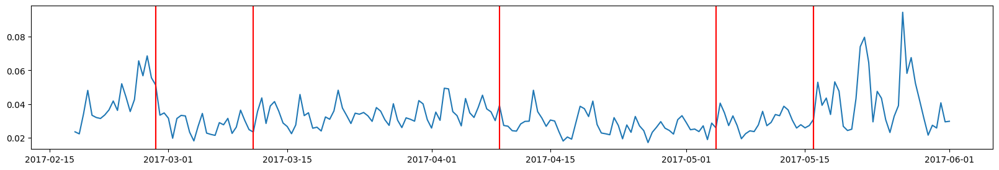

finalized change points:
2017-02-27 0.6055
2017-03-11 0.999
2017-04-09 0.9983
2017-05-04 0.9944
2017-05-16 0.9992


/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "known_prec_multiplier". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.

/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "cp_prior". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.



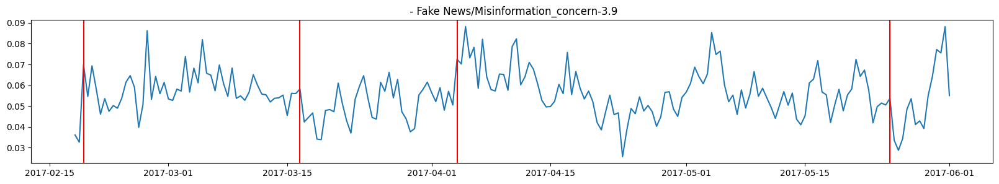

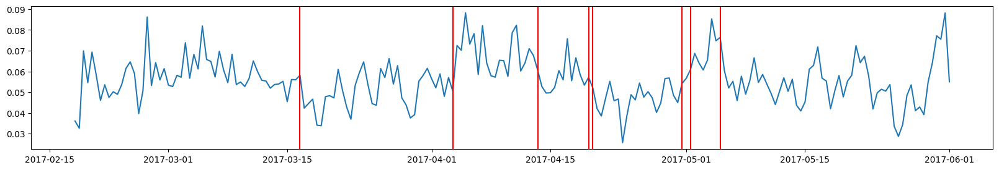

finalized change points:
2017-02-19 0.7792
2017-03-16 0.6262
2017-04-03 0.9995
2017-04-13 0.9957
2017-04-30 0.9995
2017-05-25 0.7805


/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "known_prec_multiplier". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.

/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "cp_prior". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.



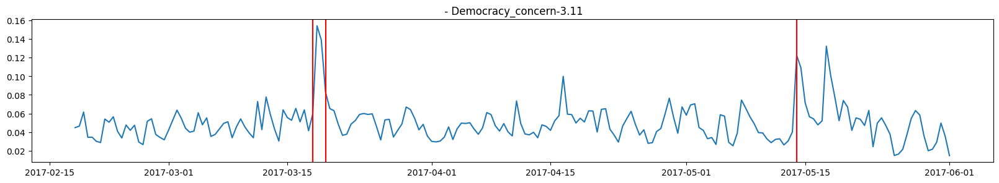

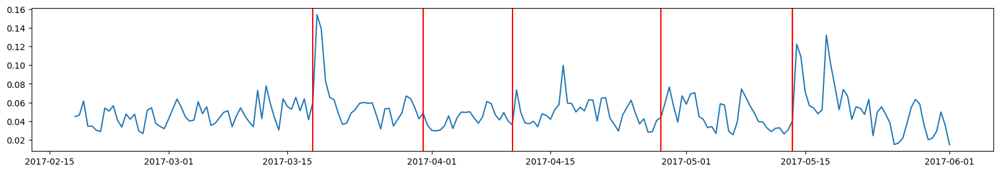

finalized change points:
2017-03-18 0.5815
2017-03-31 0.9981
2017-04-10 0.9914
2017-04-28 0.999
2017-05-13 1.0


/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "known_prec_multiplier". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.

/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "cp_prior". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.



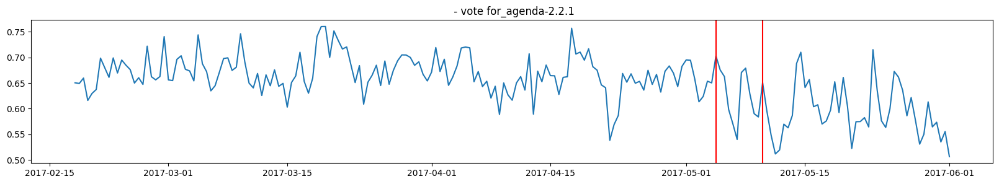

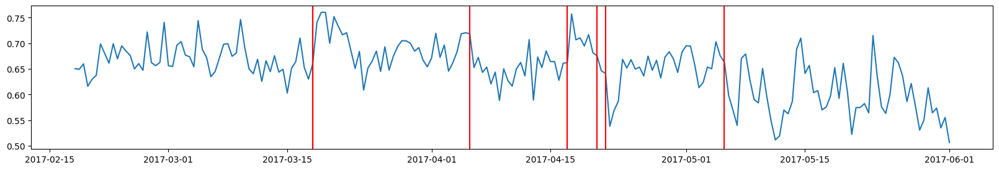

finalized change points:
2017-03-18 0.9998
2017-04-05 0.9997
2017-04-17 0.9986
2017-05-04 0.627


/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "known_prec_multiplier". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.

/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "cp_prior". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.



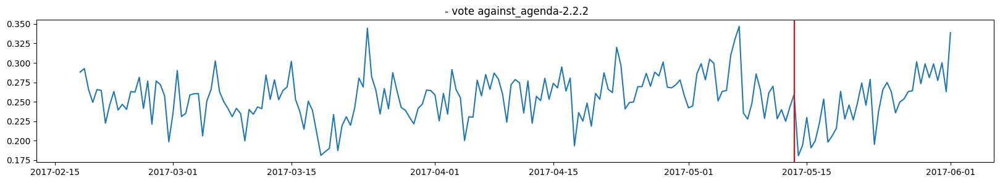

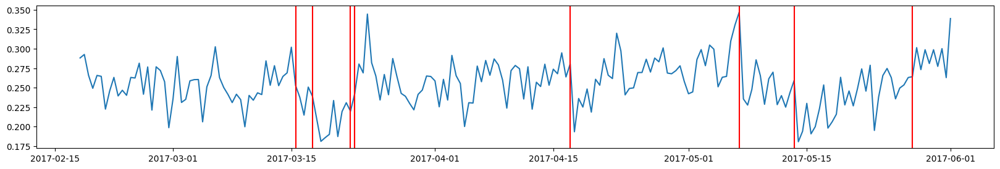

finalized change points:
2017-03-15 0.9947
2017-04-17 0.9953
2017-05-07 0.999
2017-05-27 0.9974


/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "known_prec_multiplier". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.

/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "cp_prior". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.



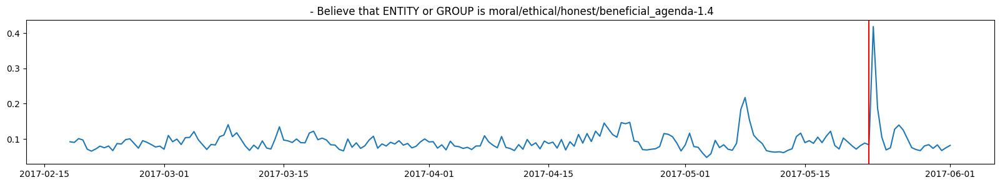

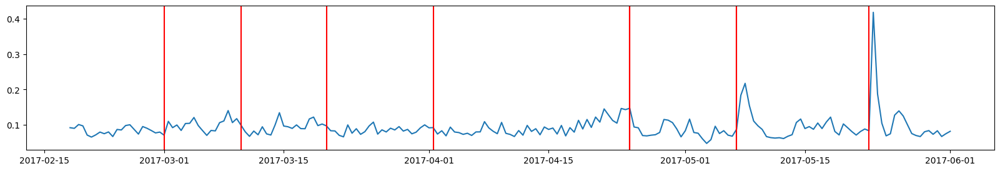

finalized change points:
2017-03-01 0.9963
2017-03-10 0.9921
2017-03-20 0.9976
2017-04-01 0.9912
2017-04-24 0.9978
2017-05-07 1.0
2017-05-22 0.9351


/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "known_prec_multiplier". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.

/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "cp_prior". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.



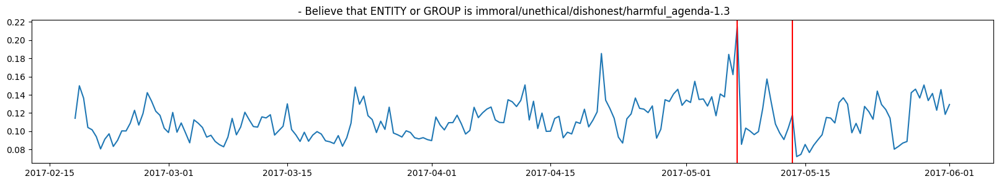

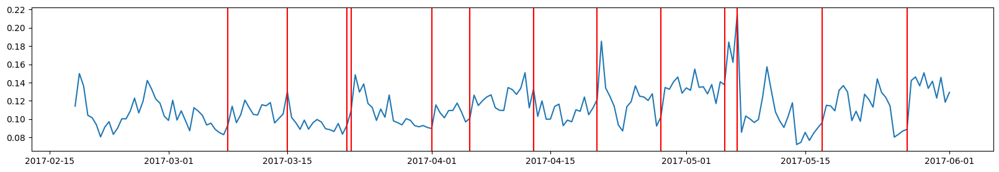

finalized change points:
2017-03-08 0.9936
2017-04-01 0.9999
2017-05-27 0.9978


/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "known_prec_multiplier". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.

/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "cp_prior". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.



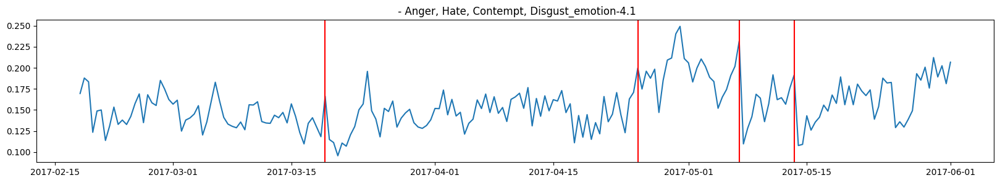

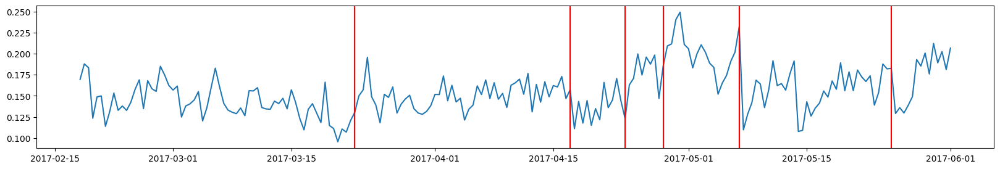

finalized change points:
2017-03-19 0.6115
2017-04-17 0.998
2017-05-07 0.9782
2017-05-25 0.9995


/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "known_prec_multiplier". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.

/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "cp_prior". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.



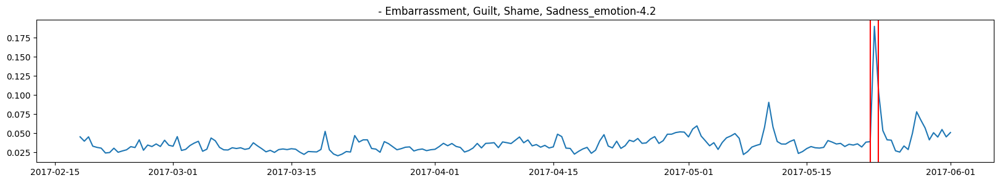

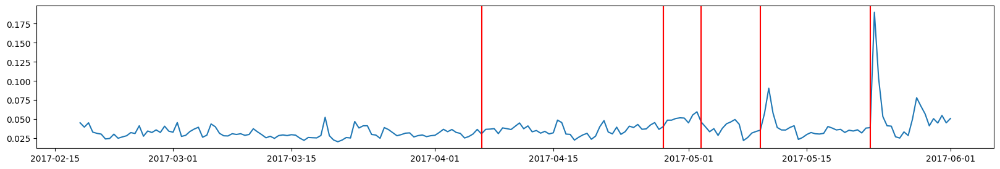

finalized change points:
2017-04-06 0.9962
2017-04-28 0.9999
2017-05-22 0.9509


/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "known_prec_multiplier". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.

/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "cp_prior". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.



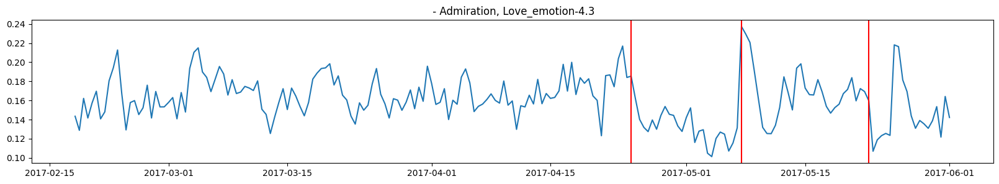

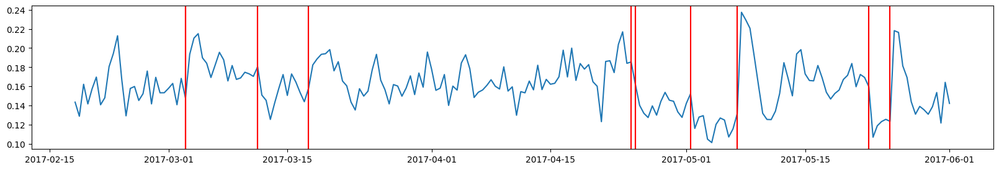

/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "known_prec_multiplier". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.

/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "cp_prior". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.



finalized change points:
2017-03-03 0.9976
2017-03-11 0.9999
2017-04-24 0.5889
2017-05-22 0.7607


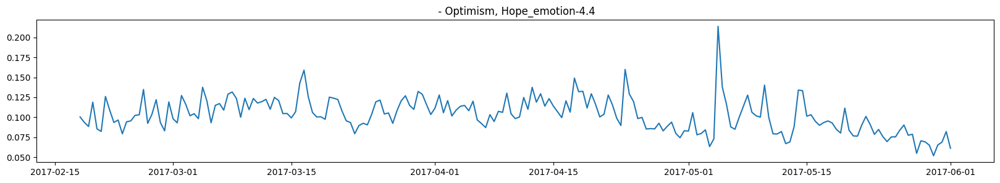

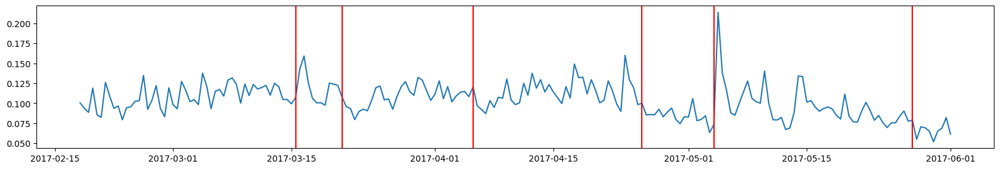

finalized change points:
2017-03-15 0.9997
2017-04-05 0.9996
2017-04-25 0.9989
2017-05-04 1.0
2017-05-27 0.9997


/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "known_prec_multiplier". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.

/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "cp_prior". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.



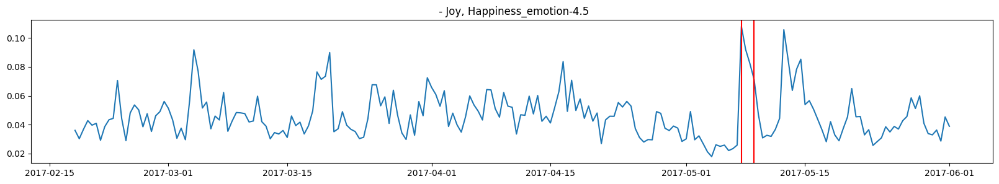

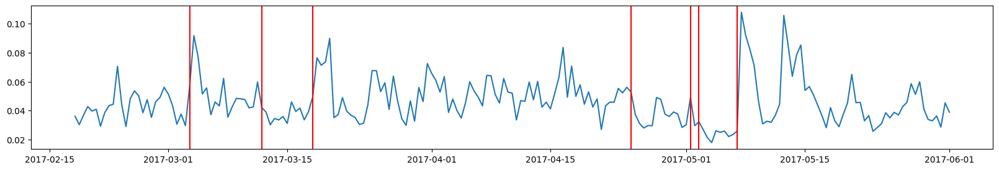

finalized change points:
2017-03-03 0.9998
2017-03-12 0.9979
2017-04-24 0.9907


/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "known_prec_multiplier". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.

/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "cp_prior". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.



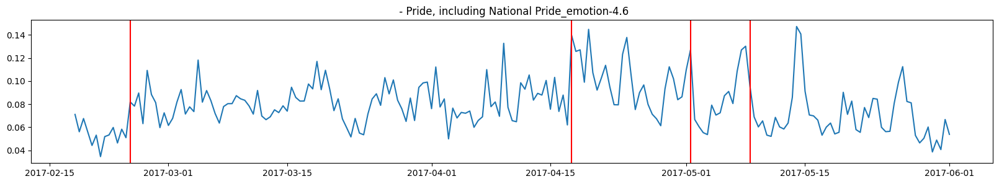

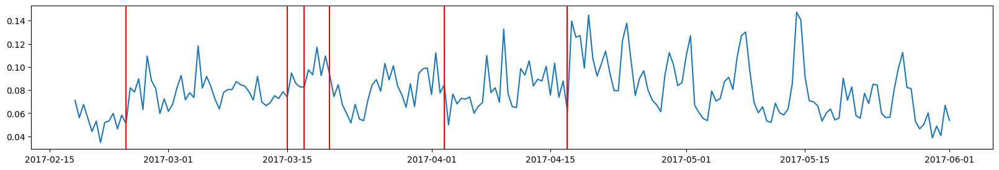

finalized change points:
2017-02-24 0.9999
2017-03-15 0.994
2017-04-02 0.9913
2017-04-17 0.999
2017-05-01 0.7018


/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "known_prec_multiplier". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.

/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "cp_prior". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.



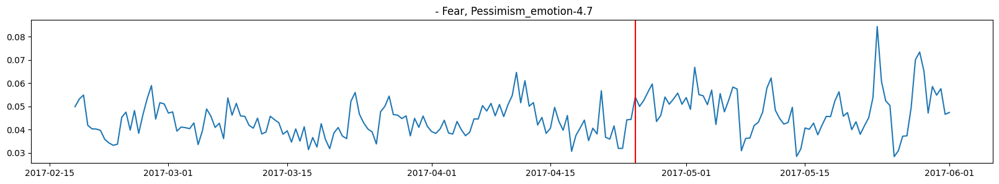

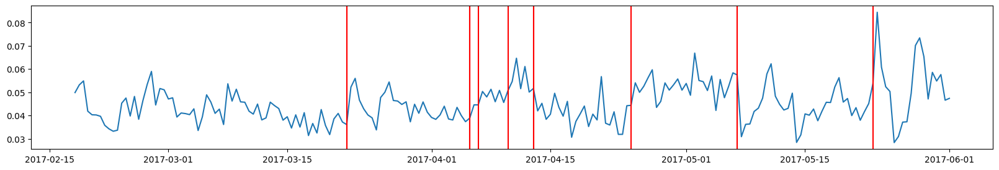

finalized change points:
2017-03-22 0.992
2017-04-05 0.9994
2017-04-24 0.9992
2017-05-07 0.9999
2017-05-23 0.9995


/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "known_prec_multiplier". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.

/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "cp_prior". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.



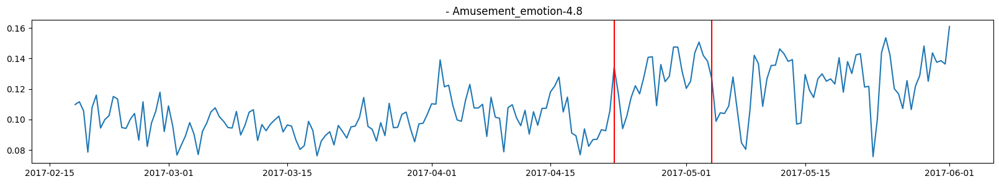

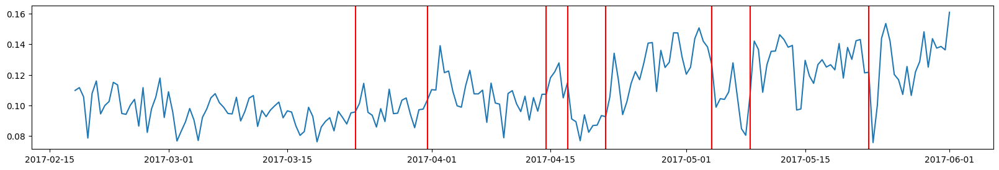

finalized change points:
2017-03-23 0.9923
2017-03-31 0.9979
2017-04-14 0.9935
2017-05-04 0.6179
2017-05-22 0.9971


/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "known_prec_multiplier". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.

/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "cp_prior". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.



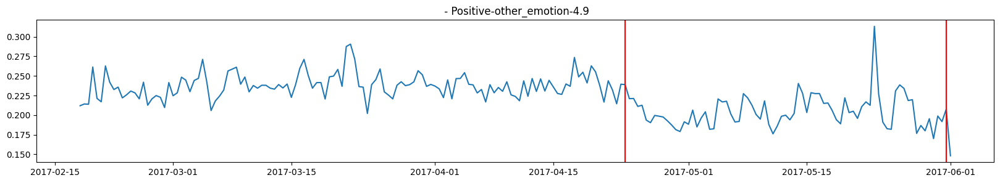

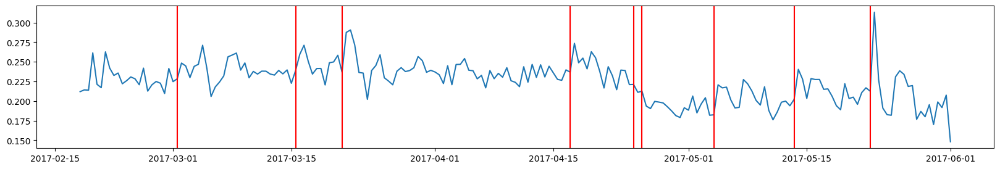

finalized change points:
2017-03-01 0.9991
2017-03-15 0.993
2017-04-17 0.9993
2017-05-04 0.9936
2017-05-13 0.9962
2017-05-22 1.0
2017-05-31 0.6874


/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "known_prec_multiplier". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.

/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "cp_prior". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.



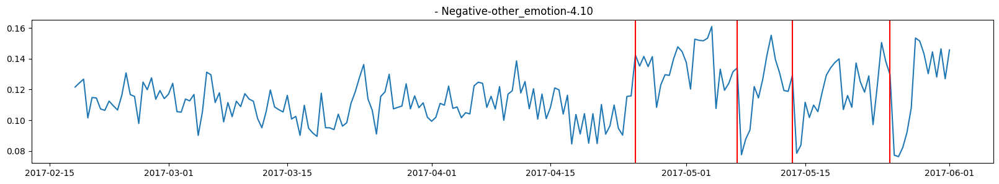

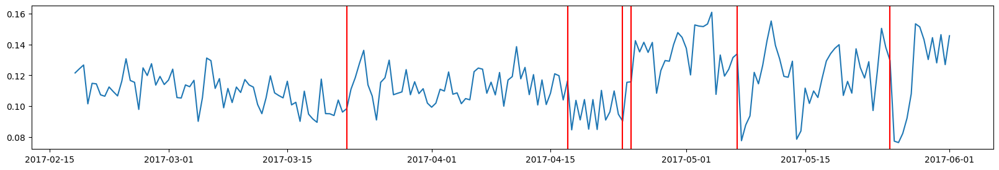

finalized change points:
2017-03-22 0.9996
2017-04-17 0.9932
2017-05-07 0.99
2017-05-25 0.9897


In [27]:
changepoints

{'Economy_concern-3.1': [(Timestamp('2017-03-07 12:00:00+0000', tz='UTC'),
   0.9990745584083915),
  (Timestamp('2017-04-20 00:00:00+0000', tz='UTC'), 0.9994597243256559),
  (Timestamp('2017-05-05 12:00:00+0000', tz='UTC'), 0.6533678038198295),
  (Timestamp('2017-05-28 12:00:00+0000', tz='UTC'), 0.9935868319095884)],
 'Terrorism and Counterterrorism_concern-3.2': [(Timestamp('2017-02-25 00:00:00+0000', tz='UTC'),
   0.9996705973628232),
  (Timestamp('2017-03-12 00:00:00+0000', tz='UTC'), 0.9997959459463566),
  (Timestamp('2017-04-03 00:00:00+0000', tz='UTC'), 0.9999316160366183),
  (Timestamp('2017-04-20 12:00:00+0000', tz='UTC'), 0.969783930126247),
  (Timestamp('2017-05-19 00:00:00+0000', tz='UTC'), 0.9999873196023398)],
 'Religion_concern-3.3': [(Timestamp('2017-03-09 12:00:00+0000', tz='UTC'),
   0.8396171814788705),
  (Timestamp('2017-03-20 00:00:00+0000', tz='UTC'), 0.9999898614656557),
  (Timestamp('2017-04-09 00:00:00+0000', tz='UTC'), 0.9961100901631301)],
 'International Alli

/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "known_prec_multiplier". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.

/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "cp_prior". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.



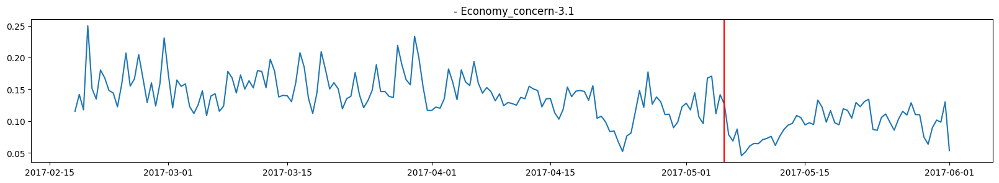

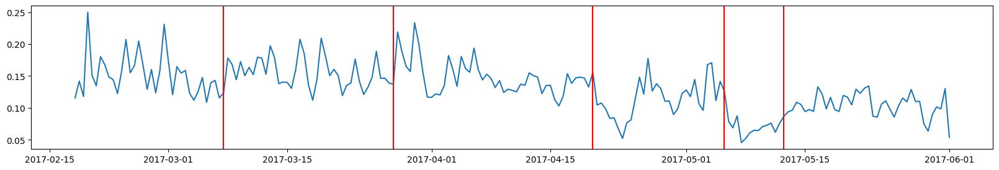

finalized change points:
2017-03-07 0.9986
2017-03-27 0.9988
2017-04-20 1.0
2017-05-05 0.6534


/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "known_prec_multiplier". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.

/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "cp_prior". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.



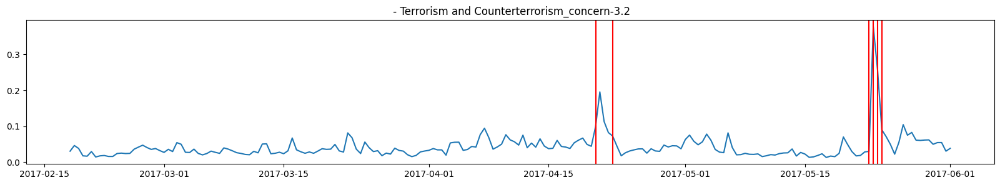

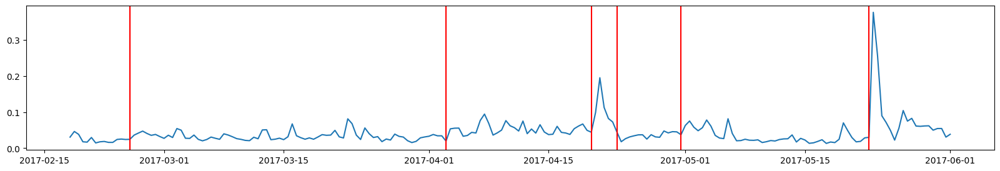

finalized change points:
2017-02-25 0.9985
2017-04-03 0.9997
2017-04-20 1.0
2017-05-22 0.99


/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "known_prec_multiplier". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.

/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "cp_prior". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.



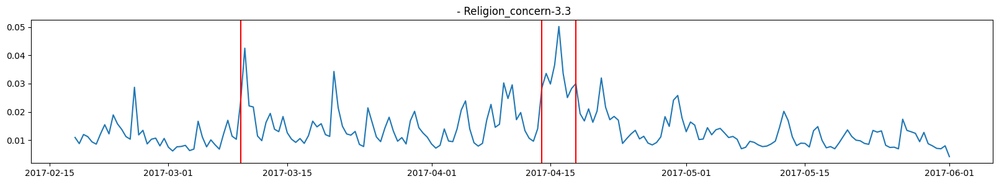

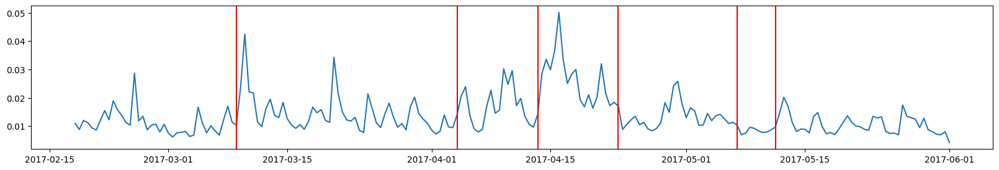

finalized change points:
2017-03-09 1.0
2017-04-04 0.9975
2017-04-13 0.9997
2017-05-07 1.0


/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "known_prec_multiplier". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.

/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "cp_prior". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.



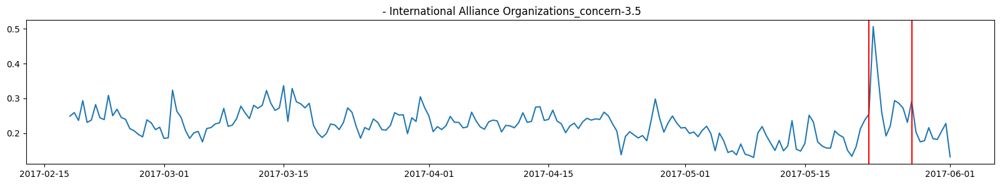

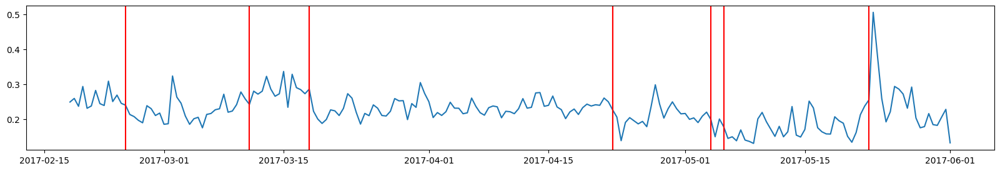

finalized change points:
2017-02-24 0.9993
2017-03-11 0.9995
2017-04-22 0.9998
2017-05-04 0.9998
2017-05-22 0.6062


/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "known_prec_multiplier". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.

/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "cp_prior". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.



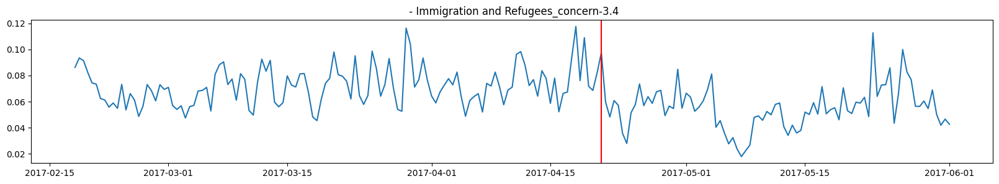

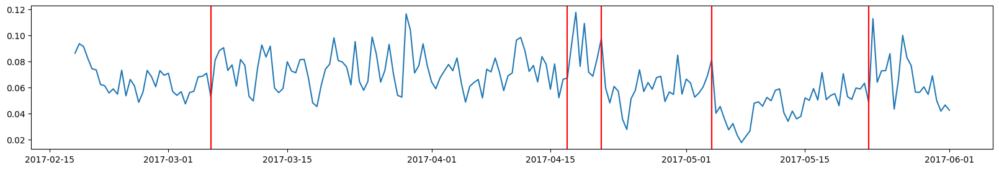

finalized change points:
2017-03-06 0.9996
2017-04-17 0.9911
2017-05-04 1.0
2017-05-22 1.0


/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "known_prec_multiplier". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.

/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "cp_prior". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.



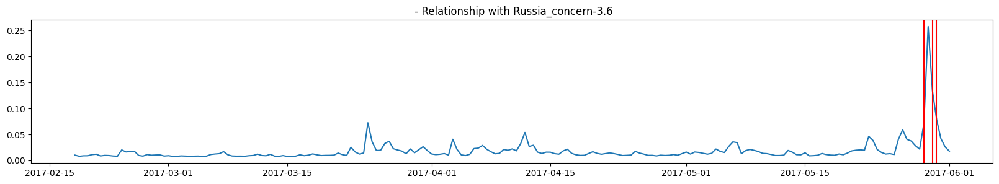

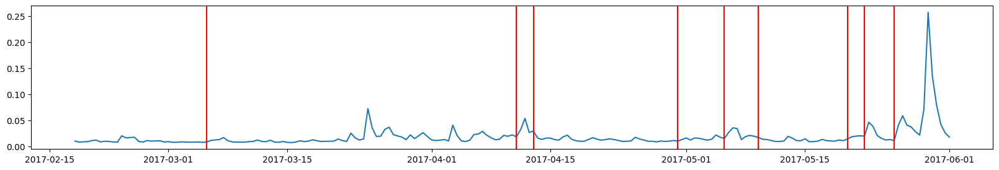

finalized change points:
2017-03-05 0.9999
2017-04-11 0.9926
2017-04-30 0.9934
2017-05-20 0.9968


/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "known_prec_multiplier". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.

/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "cp_prior". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.



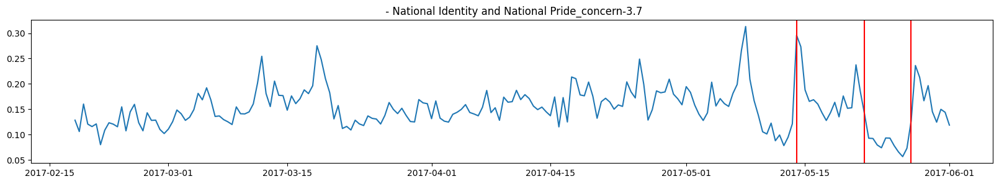

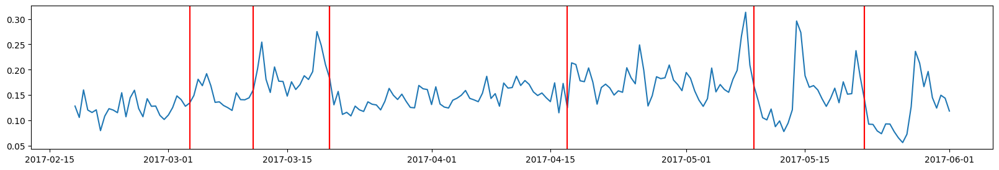

finalized change points:
2017-03-03 0.9999
2017-03-20 0.9936
2017-04-17 0.9909
2017-05-09 0.9994
2017-05-22 0.6355


/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "known_prec_multiplier". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.

/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "cp_prior". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.



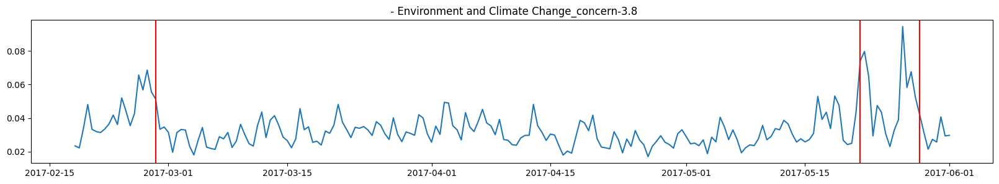

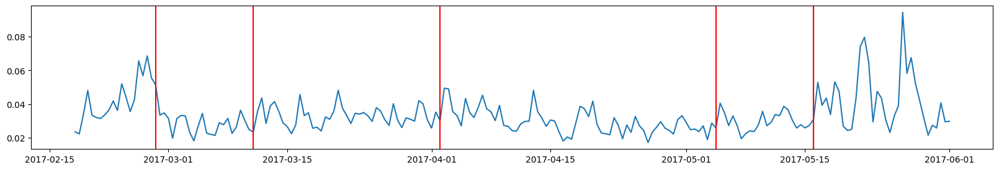

finalized change points:
2017-02-27 0.6055
2017-03-11 0.9992
2017-04-02 0.9997
2017-05-04 0.9944
2017-05-16 0.9992


/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "known_prec_multiplier". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.

/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "cp_prior". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.



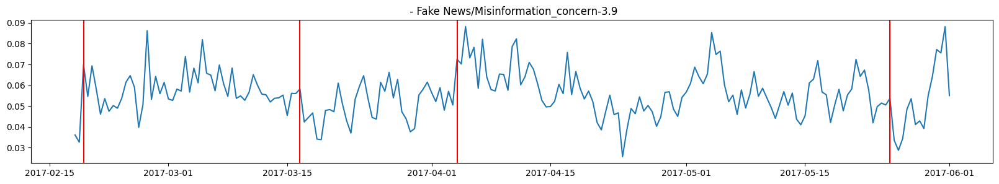

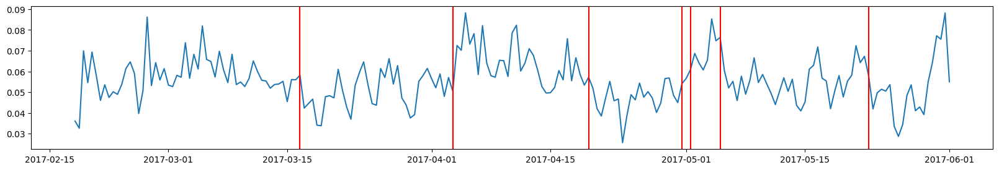

finalized change points:
2017-02-19 0.7792
2017-03-16 0.6262
2017-04-03 0.9995
2017-04-19 0.9952
2017-04-30 0.9988
2017-05-22 0.9948


/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "known_prec_multiplier". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.

/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "cp_prior". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.



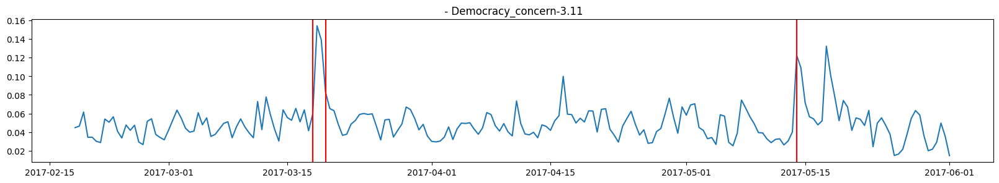

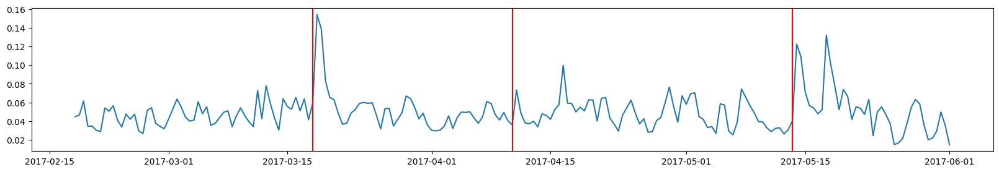

finalized change points:
2017-03-18 0.5815
2017-04-10 0.9914
2017-05-13 1.0


/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "known_prec_multiplier". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.

/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "cp_prior". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.



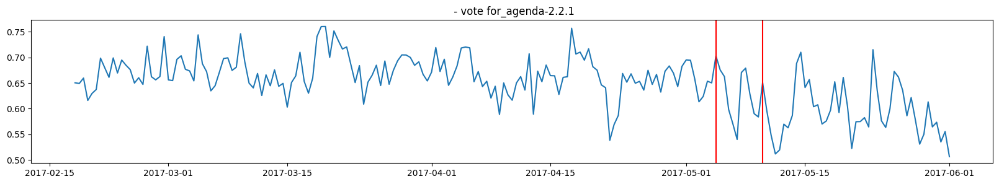

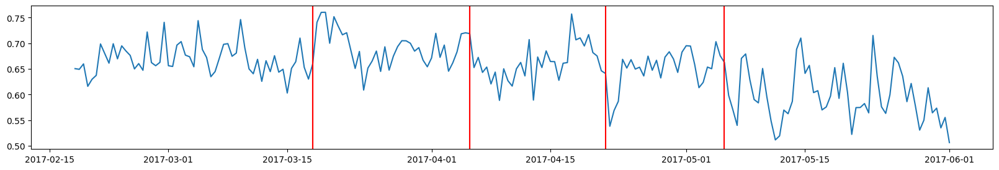

finalized change points:
2017-03-18 1.0
2017-04-05 0.9976
2017-04-21 0.9997
2017-05-04 0.627


/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "known_prec_multiplier". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.

/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "cp_prior". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.



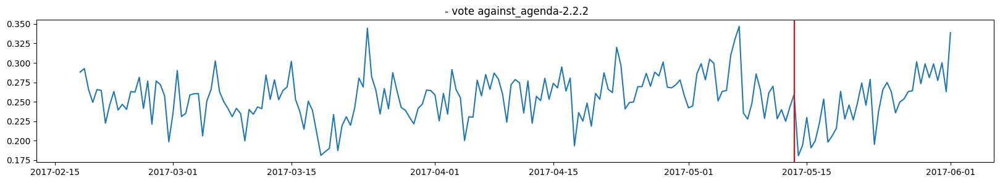

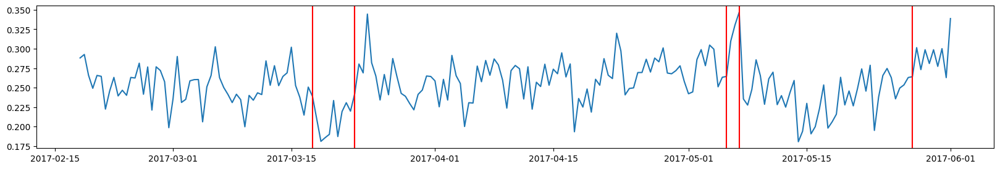

finalized change points:
2017-03-17 0.9998
2017-05-05 0.9995
2017-05-27 0.9988


/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "known_prec_multiplier". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.

/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "cp_prior". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.



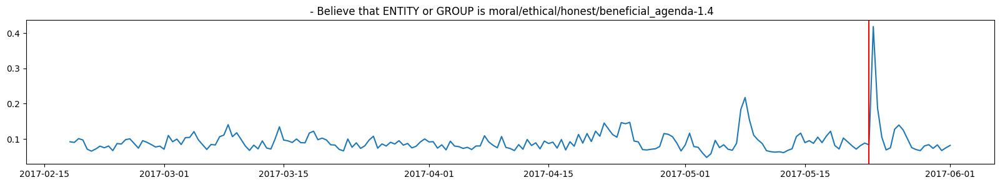

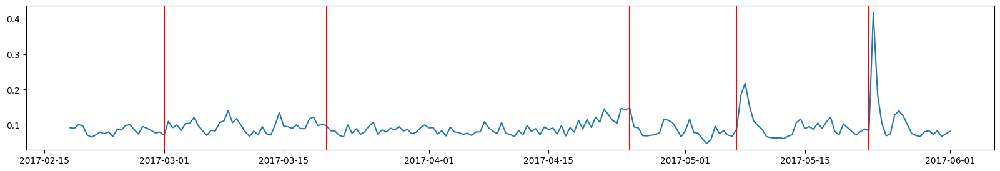

finalized change points:
2017-03-01 0.9911
2017-03-20 0.9976
2017-04-24 0.9982
2017-05-07 1.0
2017-05-22 0.9351


/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "known_prec_multiplier". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.

/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "cp_prior". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.



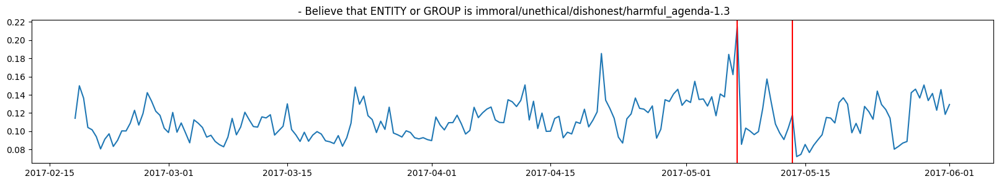

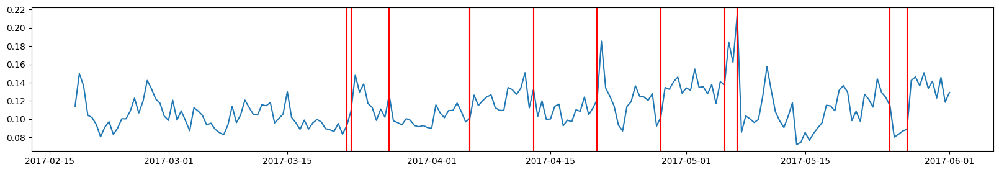

finalized change points:
2017-03-22 1.0
2017-04-05 0.9992
2017-05-25 0.9997


/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "known_prec_multiplier". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.

/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "cp_prior". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.



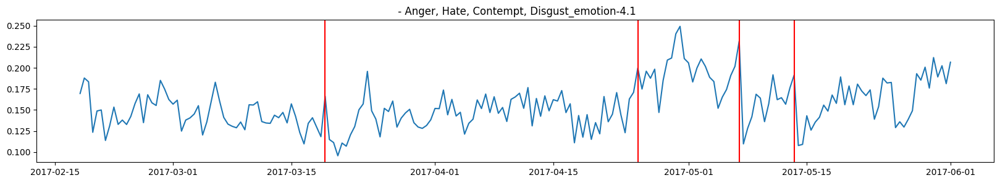

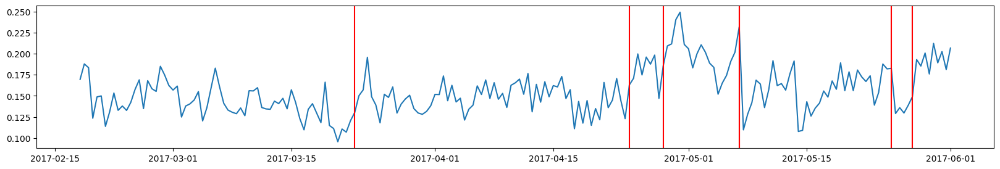

finalized change points:
2017-03-19 0.6115
2017-04-24 1.0
2017-05-07 0.9782
2017-05-25 0.9995


/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "known_prec_multiplier". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.

/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "cp_prior". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.



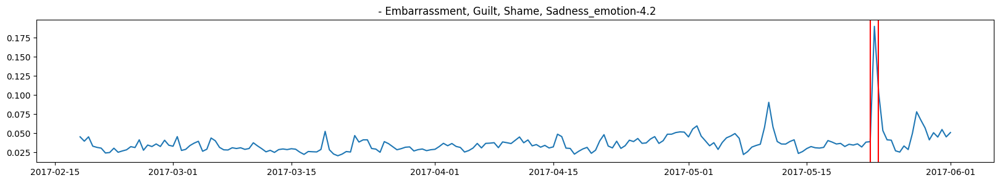

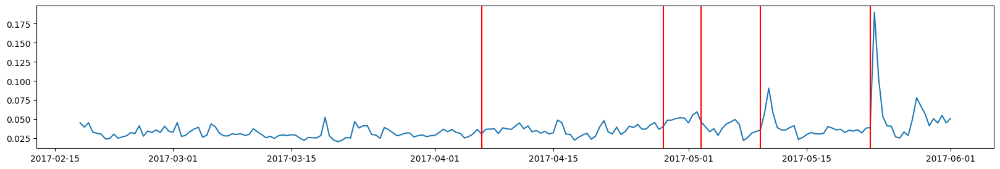

finalized change points:
2017-04-06 0.9962
2017-04-28 0.9998
2017-05-22 0.9509


/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "known_prec_multiplier". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.

/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "cp_prior". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.



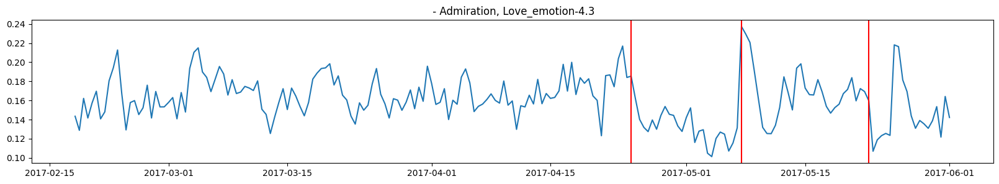

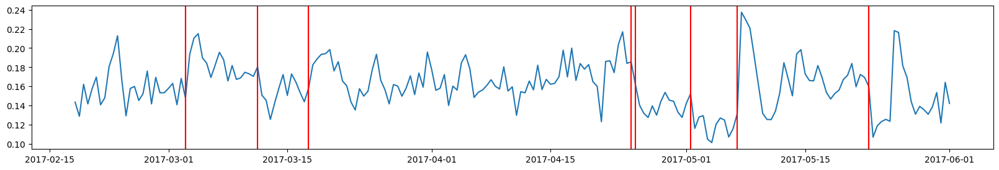

/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "known_prec_multiplier". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.

/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "cp_prior". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.



finalized change points:
2017-03-03 1.0
2017-03-11 0.9999
2017-04-24 0.5889
2017-05-22 0.7607


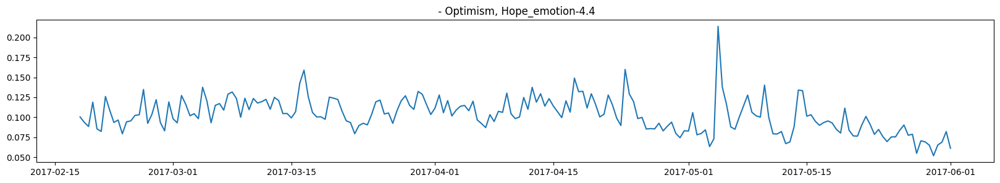

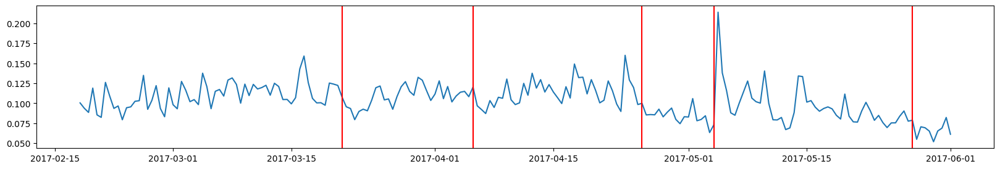

finalized change points:
2017-03-21 0.9912
2017-04-05 0.9993
2017-04-25 0.9995
2017-05-04 1.0
2017-05-27 0.9998


/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "known_prec_multiplier". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.

/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "cp_prior". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.



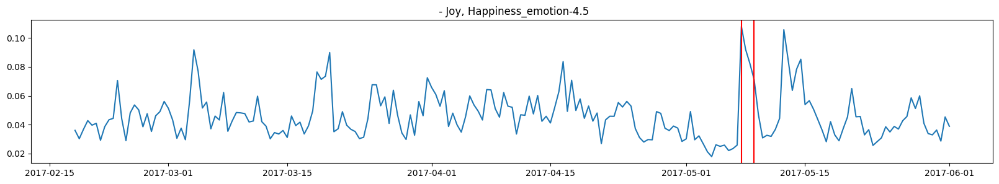

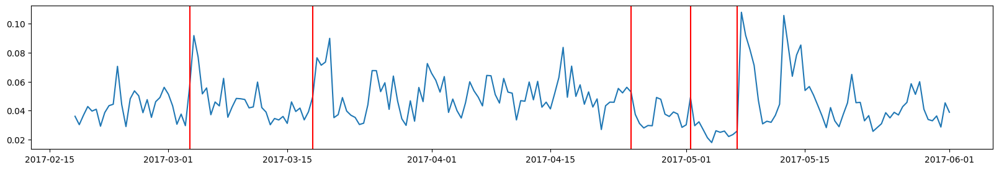

finalized change points:
2017-03-03 0.9994
2017-03-18 1.0
2017-04-24 0.9992


/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "known_prec_multiplier". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.

/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "cp_prior". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.



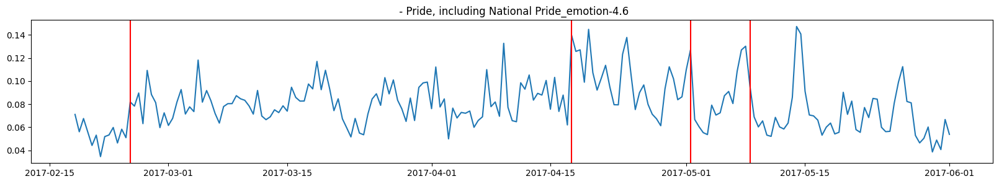

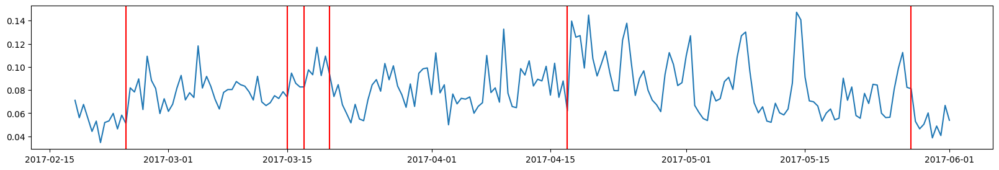

finalized change points:
2017-02-24 0.9999
2017-03-15 0.994
2017-04-17 0.9957
2017-05-01 0.7018
2017-05-27 0.9979


/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "known_prec_multiplier". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.

/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "cp_prior". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.



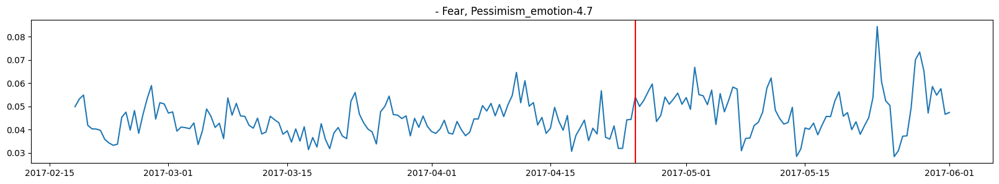

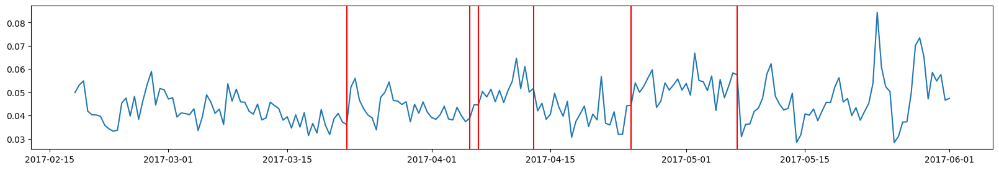

finalized change points:
2017-03-22 0.9999
2017-04-05 1.0
2017-04-24 0.9997
2017-05-07 1.0


/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "known_prec_multiplier". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.

/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "cp_prior". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.



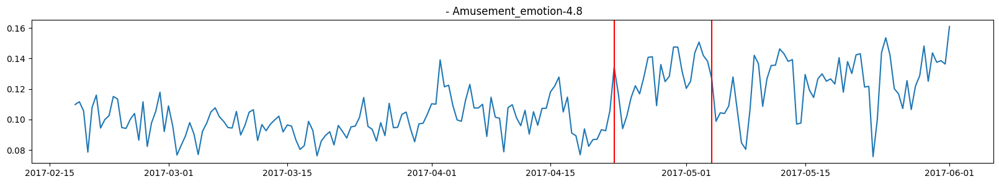

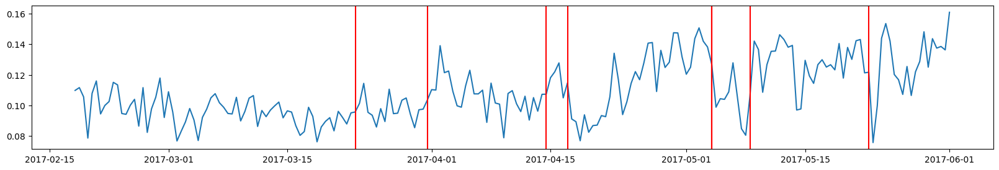

finalized change points:
2017-03-23 0.9923
2017-03-31 0.9998
2017-04-14 0.9935
2017-05-04 0.6179
2017-05-22 0.9971


/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "known_prec_multiplier". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.

/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "cp_prior". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.



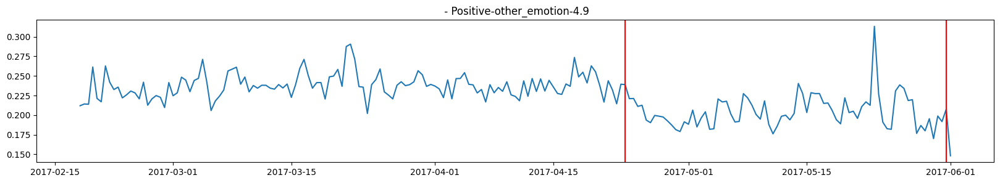

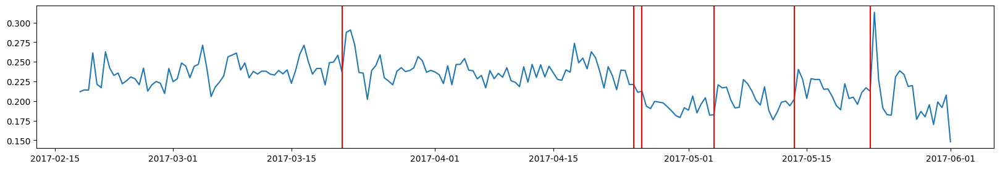

finalized change points:
2017-03-21 0.9999
2017-04-23 0.7672
2017-05-04 0.9936
2017-05-13 0.9962
2017-05-22 1.0
2017-05-31 0.6874


/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "known_prec_multiplier". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.

/Users/fionaguo/.pyenv/versions/3.9.17/envs/cpd_env/lib/python3.9/site-packages/ax/core/parameter.py:467: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "cp_prior". Defaulting to `True` for parameters of `ParameterType` FLOAT. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.



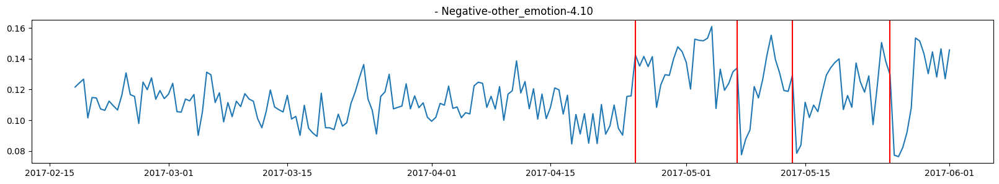

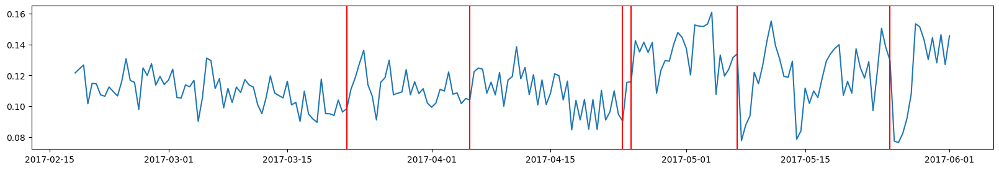

finalized change points:
2017-03-22 0.9996
2017-04-05 0.9975
2017-04-23 1.0
2017-05-07 0.99
2017-05-25 0.9897
change points detected:
2017-03-07 12:00:00+00:00
2017-03-27 12:00:00+00:00
2017-04-20 00:00:00+00:00
2017-05-05 12:00:00+00:00


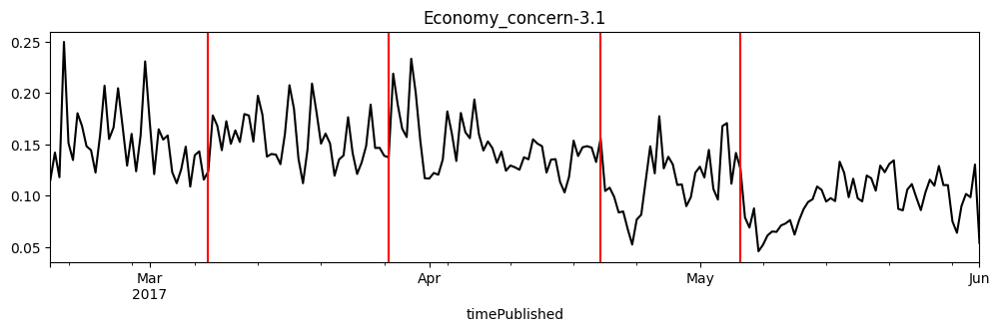

change points detected:
2017-02-25 00:00:00+00:00
2017-04-03 00:00:00+00:00
2017-04-20 00:00:00+00:00
2017-05-22 12:00:00+00:00


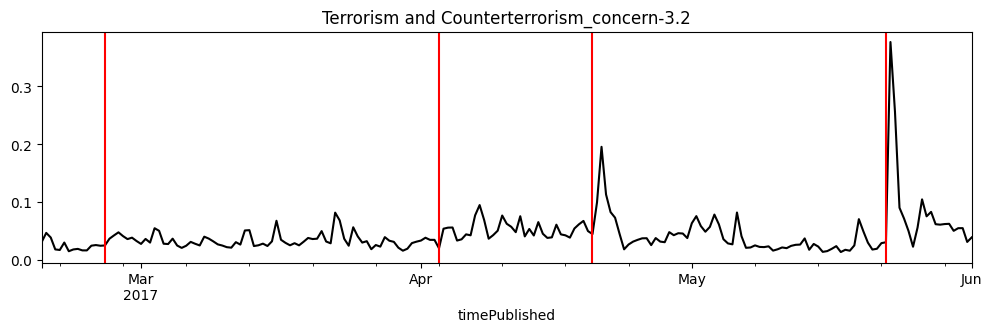

change points detected:
2017-03-09 00:00:00+00:00
2017-04-04 00:00:00+00:00
2017-04-13 12:00:00+00:00
2017-05-07 00:00:00+00:00


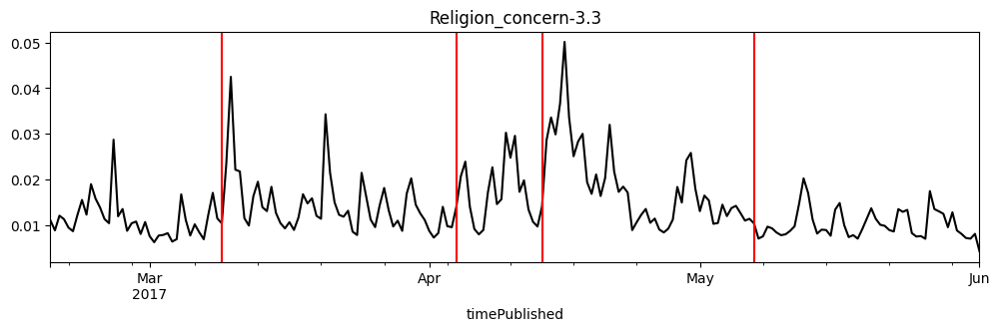

change points detected:
2017-02-24 12:00:00+00:00
2017-03-11 00:00:00+00:00
2017-04-22 12:00:00+00:00
2017-05-04 00:00:00+00:00
2017-05-22 12:00:00+00:00


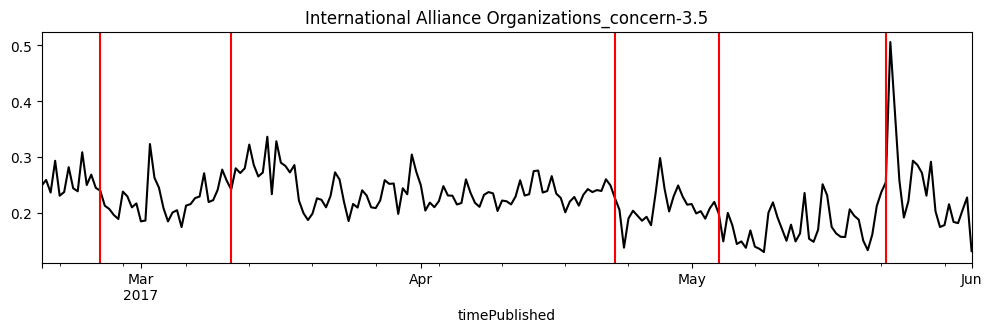

change points detected:
2017-03-06 00:00:00+00:00
2017-04-17 00:00:00+00:00
2017-05-04 00:00:00+00:00
2017-05-22 12:00:00+00:00


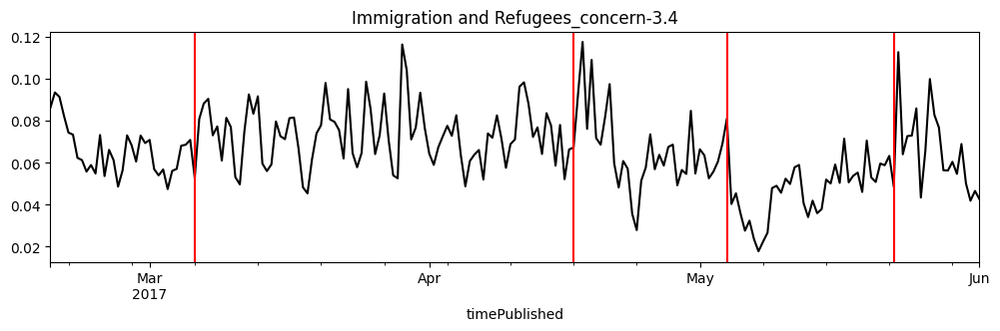

change points detected:
2017-03-05 12:00:00+00:00
2017-04-11 00:00:00+00:00
2017-04-30 00:00:00+00:00
2017-05-20 00:00:00+00:00


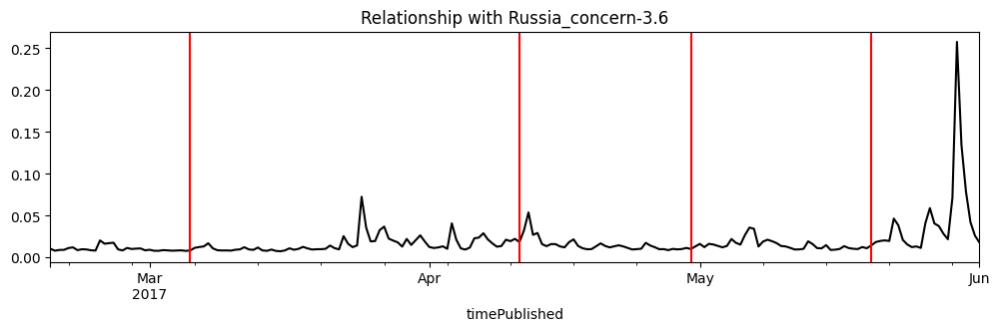

change points detected:
2017-03-03 12:00:00+00:00
2017-03-20 00:00:00+00:00
2017-04-17 00:00:00+00:00
2017-05-09 00:00:00+00:00
2017-05-22 00:00:00+00:00


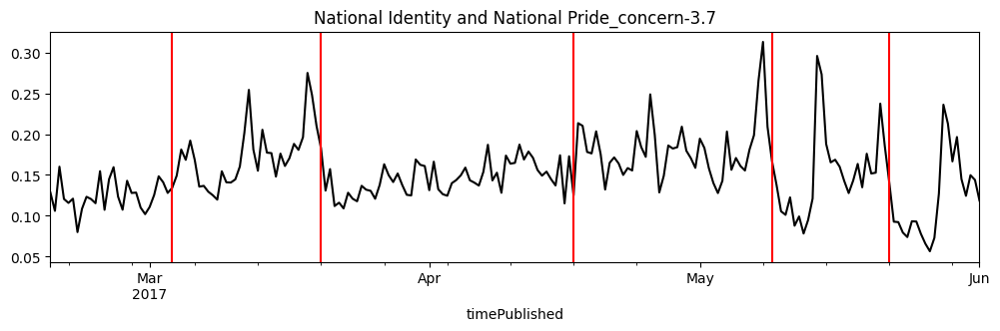

change points detected:
2017-02-27 12:00:00+00:00
2017-03-11 00:00:00+00:00
2017-04-02 00:00:00+00:00
2017-05-04 12:00:00+00:00
2017-05-16 00:00:00+00:00


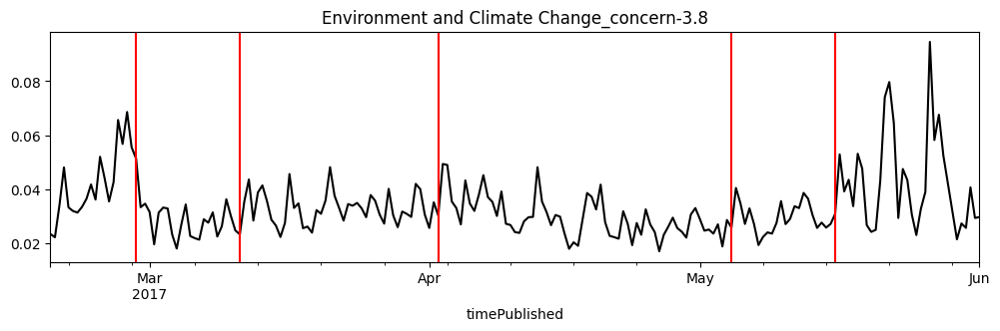

change points detected:
2017-02-19 00:00:00+00:00
2017-03-16 12:00:00+00:00
2017-04-03 12:00:00+00:00
2017-04-19 12:00:00+00:00
2017-04-30 12:00:00+00:00
2017-05-22 12:00:00+00:00


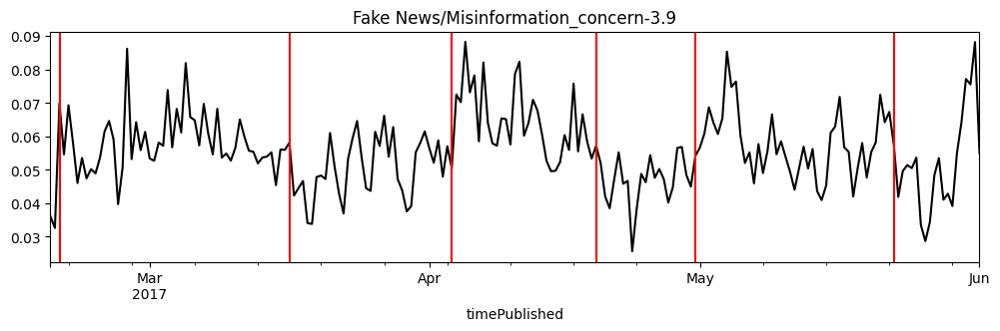

change points detected:
2017-03-18 00:00:00+00:00
2017-04-10 12:00:00+00:00
2017-05-13 12:00:00+00:00


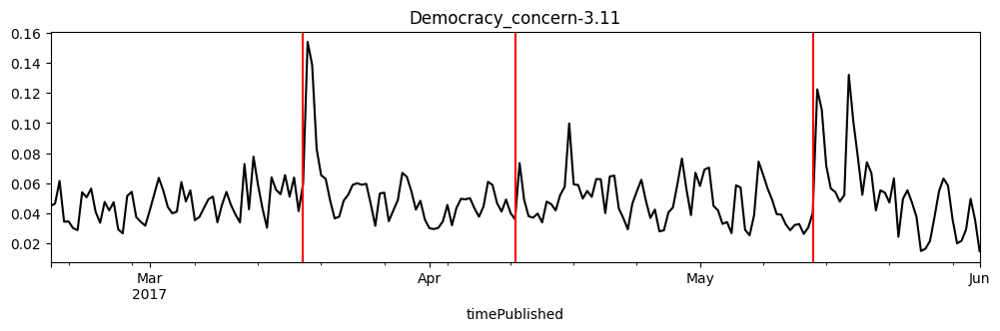

change points detected:
2017-03-18 00:00:00+00:00
2017-04-05 12:00:00+00:00
2017-04-21 12:00:00+00:00
2017-05-04 12:00:00+00:00


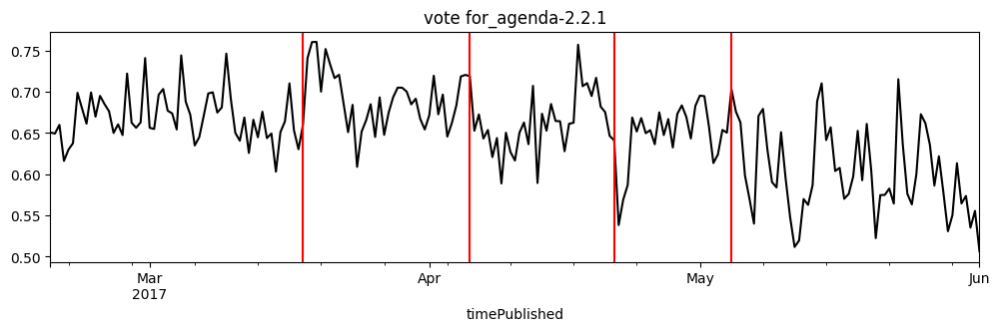

change points detected:
2017-03-17 12:00:00+00:00
2017-05-05 12:00:00+00:00
2017-05-27 12:00:00+00:00


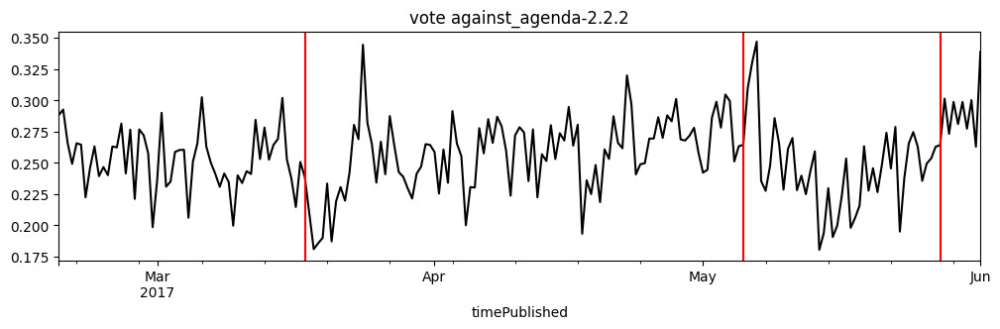

change points detected:
2017-03-01 00:00:00+00:00
2017-03-20 00:00:00+00:00
2017-04-24 12:00:00+00:00
2017-05-07 00:00:00+00:00
2017-05-22 12:00:00+00:00


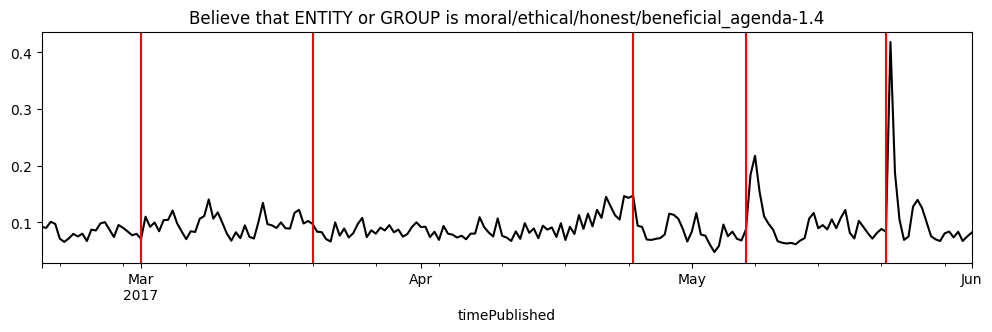

change points detected:
2017-03-22 00:00:00+00:00
2017-04-05 12:00:00+00:00
2017-05-25 00:00:00+00:00


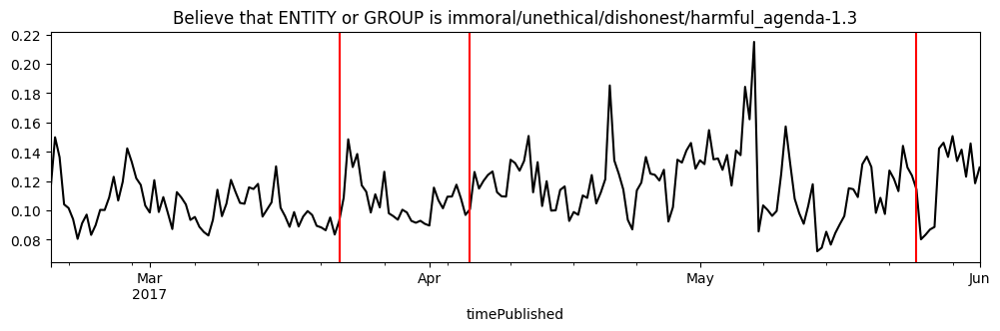

change points detected:
2017-03-19 00:00:00+00:00
2017-04-24 00:00:00+00:00
2017-05-07 00:00:00+00:00
2017-05-25 00:00:00+00:00


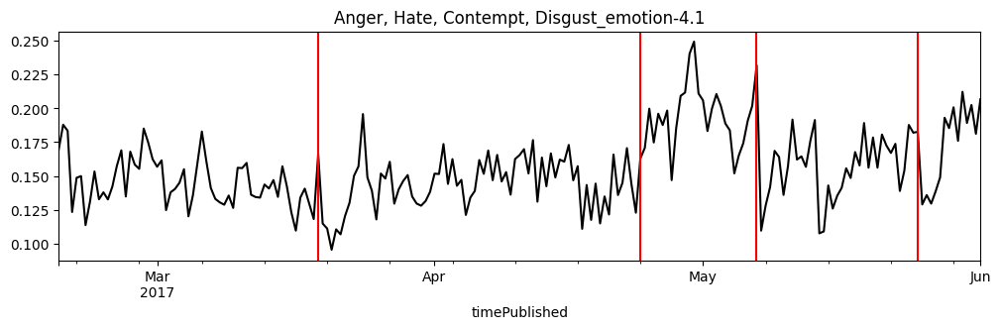

change points detected:
2017-04-06 12:00:00+00:00
2017-04-28 00:00:00+00:00
2017-05-22 12:00:00+00:00


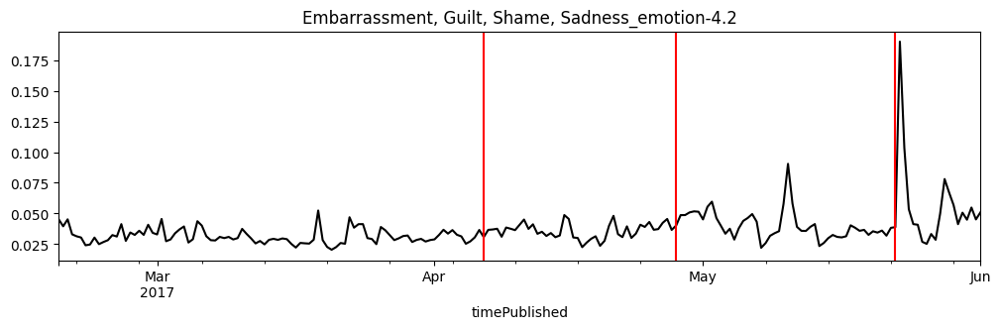

change points detected:
2017-03-03 00:00:00+00:00
2017-03-11 12:00:00+00:00
2017-04-24 12:00:00+00:00
2017-05-22 12:00:00+00:00


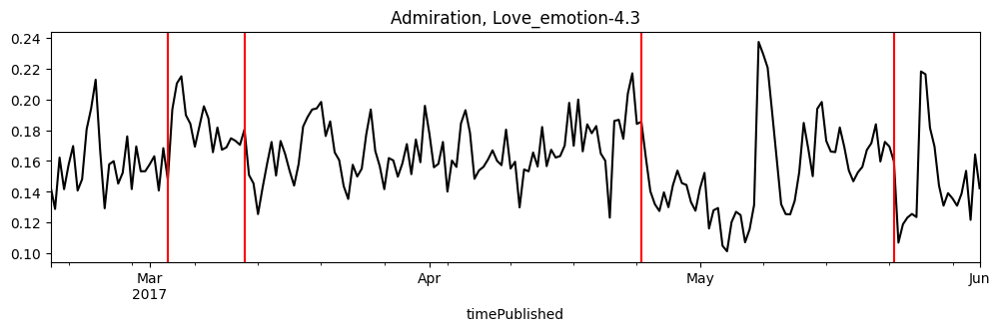

change points detected:
2017-03-21 00:00:00+00:00
2017-04-05 12:00:00+00:00
2017-04-25 12:00:00+00:00
2017-05-04 00:00:00+00:00
2017-05-27 12:00:00+00:00


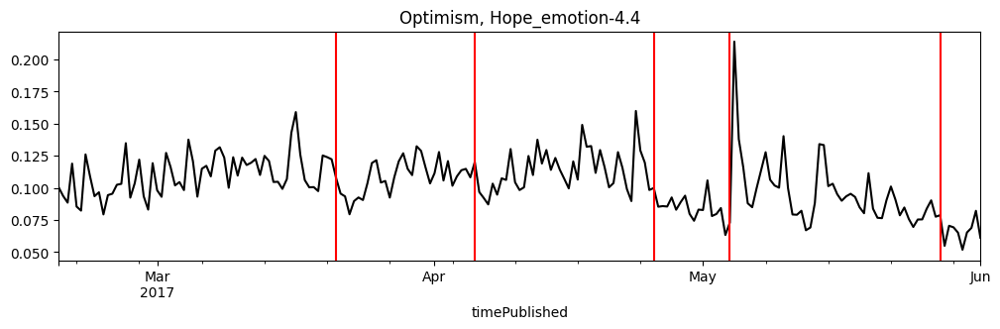

change points detected:
2017-03-03 12:00:00+00:00
2017-03-18 00:00:00+00:00
2017-04-24 12:00:00+00:00


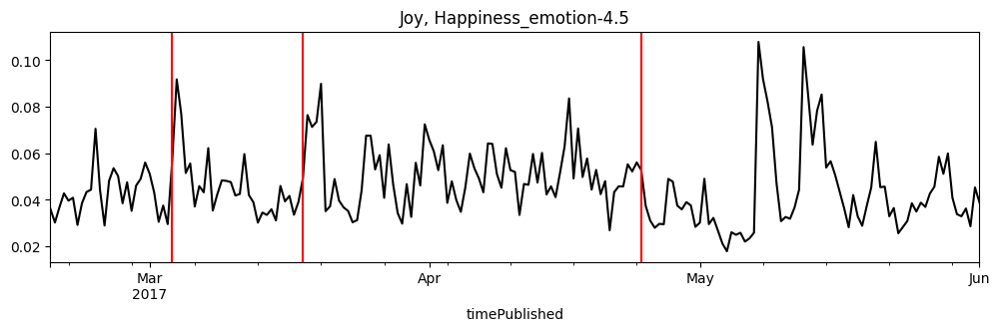

change points detected:
2017-02-24 00:00:00+00:00
2017-03-15 00:00:00+00:00
2017-04-17 00:00:00+00:00
2017-05-01 12:00:00+00:00
2017-05-27 12:00:00+00:00


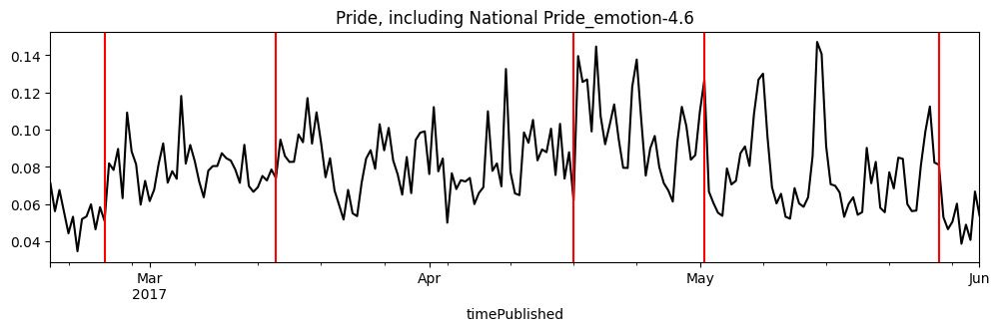

change points detected:
2017-03-22 00:00:00+00:00
2017-04-05 12:00:00+00:00
2017-04-24 12:00:00+00:00
2017-05-07 00:00:00+00:00


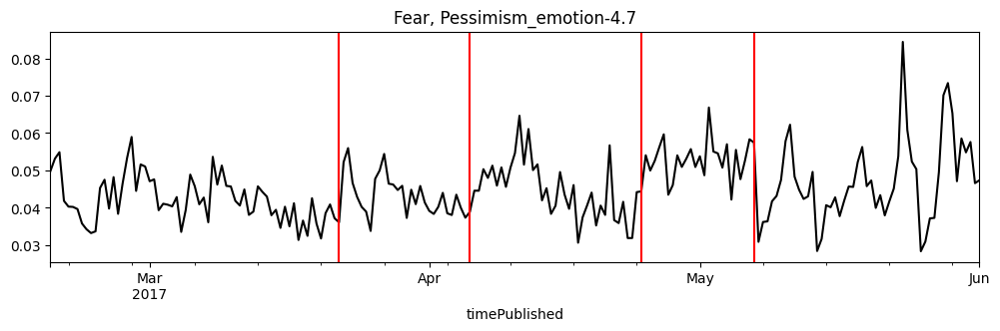

change points detected:
2017-03-23 00:00:00+00:00
2017-03-31 12:00:00+00:00
2017-04-14 12:00:00+00:00
2017-05-04 00:00:00+00:00
2017-05-22 12:00:00+00:00


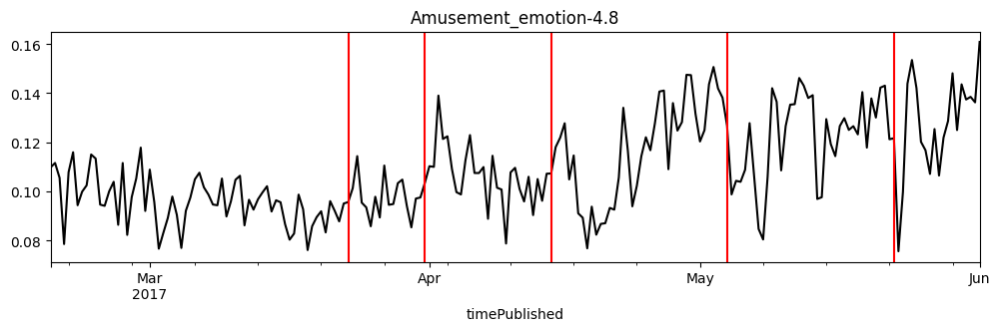

change points detected:
2017-03-21 00:00:00+00:00
2017-04-23 12:00:00+00:00
2017-05-04 00:00:00+00:00
2017-05-13 12:00:00+00:00
2017-05-22 12:00:00+00:00
2017-05-31 12:00:00+00:00


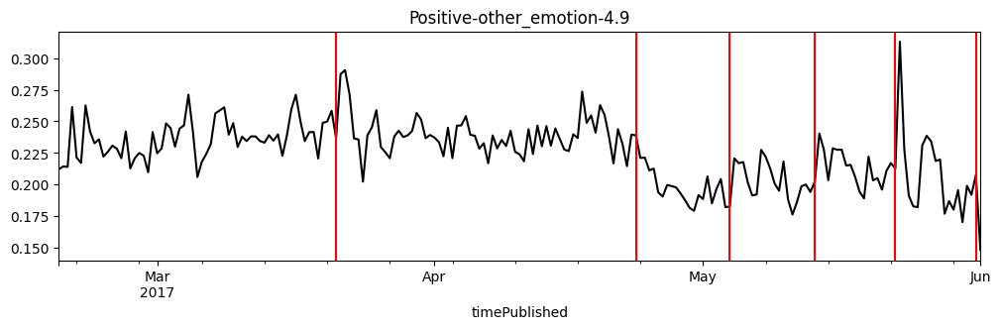

change points detected:
2017-03-22 00:00:00+00:00
2017-04-05 12:00:00+00:00
2017-04-23 12:00:00+00:00
2017-05-07 00:00:00+00:00
2017-05-25 00:00:00+00:00


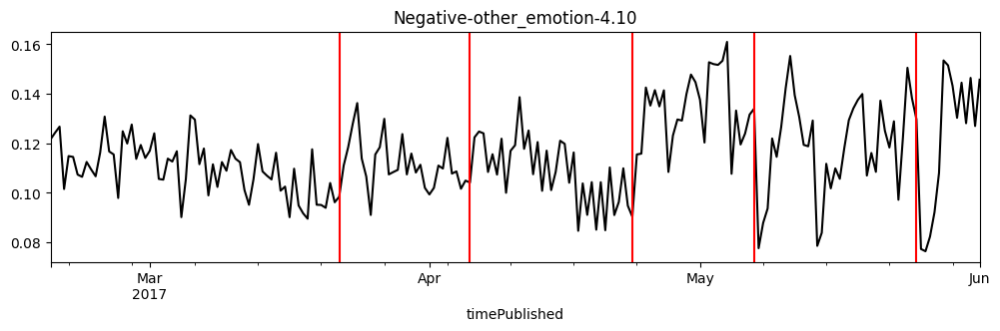

In [34]:
changepoints = changepoint_detection(df_hourly.reset_index(),'timePublished',all_cols)

def plot_separate_ts(df,columns,events=[]):
    for c in columns:
        plt.figure()
        df[c].plot(figsize=[12,3],kind='line',color='black')
        for e in events:
            plt.axvline(pd.Timestamp(e[0]),color='red',linestyle='-')
        plt.title(c)
#         plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15),
#           fancybox=True, shadow=True, ncol=3)
        plt.show()

for c in all_cols:
    tmp_events = changepoints[c]
    print('change points detected:')
    for t in tmp_events:
        print(t[0])
    plot_separate_ts(df_hourly,[c],events=tmp_events) # emot_mf_colnames
    

In [36]:
with open('../changepoints_phase1a.pkl','wb') as f:
    pickle.dump(changepoints,f)